In [118]:
import numpy as np
import pandas as pd
from datetime import datetime
import matplotlib.pyplot as plt
import pylab
from sklearn.cluster import KMeans
from fcmeans import FCM
from scipy import interpolate

In [2]:
path = 'Downloads\iqds\iqds'
'''
case.csv – таблица с описанием подтверждённых аномалий. Содержит информацию по связанному с аномалией оборудованию ("equipment_id") и объекту ("facility_id").
equipment.csv – таблица, показывающая из каких датчиков ("io_id") состоит оборудование.
facility.csv – таблица, показывающая из каких датчиков микроклимата ("io_id") состоит объект.
*_ data_meter_*.csv – таблицы, содержащие данные для соответствующих датчиков.
'''

'\ncase.csv – таблица с описанием подтверждённых аномалий. Содержит информацию по связанному с аномалией оборудованию ("equipment_id") и объекту ("facility_id").\nequipment.csv – таблица, показывающая из каких датчиков ("io_id") состоит оборудование.\nfacility.csv – таблица, показывающая из каких датчиков микроклимата ("io_id") состоит объект.\n*_ data_meter_*.csv – таблицы, содержащие данные для соответствующих датчиков.\n'

In [101]:
elec = pd.read_csv('Downloads/iqds/iqds/0_data_meter_electricity.csv')
hum = pd.read_csv('Downloads/iqds/iqds/0_data_meter_humidity.csv')
temp = pd.read_csv('Downloads/iqds/iqds/0_data_meter_temperature.csv')
case = pd.read_csv('Downloads/iqds/iqds/case.csv')
equipment = pd.read_csv('Downloads/iqds/iqds/equipment.csv')
facility = pd.read_csv('Downloads/iqds/iqds/facility.csv')

c:\users\lomonosova\appdata\local\programs\python\python38\lib\site-packages\IPython\core\interactiveshell.py:3145: DtypeWarning: Columns (9,10,11,12,13,16,24,25,26,27,28,31,39,40,41,42,43,46) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


In [4]:
def gr(data, col1, col2, c):
    date = data[col1]
    x = data[col2]
    plt.figure(figsize=(20,12))

#plt.title('Зависимость кол-ва выпущенных фильмов от года выпуска', fontsize=10)

    plt.plot(date, x, linestyle='-', color=c)

    plt.grid(True) 

#plt.yticks(range(min(x), max(x), 30))
#plt.xticks(range(1925, 2021, 6))

#plt.ylabel('quantity',  fontsize=10)
#plt.xlabel('release year',  fontsize=10)


    plt.show()

# 0_data_meter_electricity.csv 
event_timestamp: Unix time. 2020-12-31 21:00:33 - 2022-01-31 20:59:54 \
Известно: 19.01.2022 – корректная работа оборудования, 20.01.2022 – повышенное энергопотребление.\
Вкл: \
Выкл:

In [5]:
elec

,event_timestamp,io_id,Urms,Irms,P,AP_energy,RP_energy,S_energy,NP_energy,Total_P,...,S_energy_max,NP_energy_max,Total_P_max,Total_AP_energy_max,Total_RP_energy_max,Total_S_energy_max,Total_NP_energy_max,Phase_angle_max,Voltage_angle_max,Frequency_max
0,1609448433,5e03a7a2832a17ee33585ea4,"[233.4525,233.3976,233.4744]","[0.177588888888889,0.122588888888889,0.1229333...","[9.62666666666667,-0.0342857142857143,-0.095]","[15693.054695,14515.16532,14633.57355]",[],[],[],9.497381,...,[],[],9.63,44841.7936,\N,\N,\N,"[-77.3,-90,-90]","[0,-119.9,120]",49.97
1,1609448553,5e03a7a2832a17ee33585ea4,"[230.827,230.6709,230.8078]","[0.1754,0.1221,0.1223625]","[9.63714285714286,-0.095,-0.03]","[15693.055025,14515.16532,14633.57355]",[],[],[],9.512143,...,[],[],9.63,44841.79393,\N,\N,\N,"[-77.1,-90.1,-90]","[0,-120.1,120]",50.01
2,1609448673,5e03a7a2832a17ee33585ea4,"[230.835,230.743,230.8648]","[0.1745,0.122085714285714,0.122444444444444]","[9.455,-0.03,-0.03]","[15693.05534,14515.16532,14633.57355]",[],[],[],9.395,...,[],[],9.5,44841.79424,\N,\N,\N,"[-77.3,-90.1,-90.1]","[0,-120,120]",49.99
3,1609448793,5e03a7a2832a17ee33585ea4,"[230.79,230.818,230.6922]","[0.179128571428571,0.12,0.1223]","[10.262,0.0475,-0.3775]","[15693.055655,14515.16532,14633.57355]",[],[],[],9.932,...,[],[],10.13,44841.79456,\N,\N,\N,"[-76.6,-89.7,-90]","[0,-119.9,120]",49.97
4,1609448913,5e03a7a2832a17ee33585ea4,"[230.9387,230.9392,230.8515]","[0.18305,0.12134,0.1224125]","[10.5,0.088,-0.31]","[15693.056,14515.16532,14633.57355]",[],[],[],10.278,...,[],[],10.38,44841.79491,\N,\N,\N,"[-76.5,-89.6,-90.5]","[0,-120,120]",49.98
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
279660,1643662314,5e03a7a2832a17ee33585ea4,"[230.144,230.034,230.427]","[0.2,0.1,0.1]","[9.88,-0.25,0.06]","[45109.13062,41172.24145,41483.49999]","[344.03577,166.16952,192.81239]","[46750.14248,42543.40906,42818.74515]","[4212.0699,704.8758,580.5031]",9.69,...,"[46750.14248,42543.40906,42818.74515]","[4212.0699,704.8758,580.5031]",10.12,127764.87206,703.01768,132112.29669,5497.4488,"[-76.4,-90.4,-89.9]","[0,-120.1,119.7]",49.98
279661,1643662434,5e03a7a2832a17ee33585ea4,"[230.225,230.125,230.528]","[0.2,0.1,0.1]","[10.06,-0.13,0]","[45109.13095,41172.24145,41483.49999]","[344.03577,166.16952,192.81239]","[46750.14379,42543.40997,42818.74606]","[4212.0699,704.8758,580.5031]",9.93,...,"[46750.14379,42543.40997,42818.74606]","[4212.0699,704.8758,580.5031]",10.13,127764.87239,703.01768,132112.29982,5497.4488,"[-76.4,-90.4,-89.8]","[0,-120.3,119.5]",49.97
279662,1643662554,5e03a7a2832a17ee33585ea4,"[230.449,230.165,230.52]","[0.2,0.1,0.1]","[9.69,-0.25,0]","[45109.13128,41172.24145,41483.49999]","[344.03577,166.16952,192.81239]","[46750.14515,42543.41092,42818.74702]","[4212.0699,704.8758,580.5031]",9.44,...,"[46750.14515,42543.41092,42818.74702]","[4212.0699,704.8758,580.5031]",9.99,127764.87272,703.01768,132112.30309,5497.4488,"[-76.5,-90.3,-89.9]","[0,-120.2,119.6]",50.0
279663,1643662674,5e03a7a2832a17ee33585ea4,"[230.549,230.305,230.686]","[0.2,0.1,0.1]","[9.75,-0.19,0]","[45109.13161,41172.24145,41483.49999]","[344.03577,166.16952,192.81239]","[46750.1465,42543.41186,42818.74797]","[4212.0699,704.8758,580.5031]",9.56,...,"[46750.1465,42543.41186,42818.74797]","[4212.0699,704.8758,580.5031]",9.87,127764.87305,703.01768,132112.30633,5497.4488,"[-76.6,-90.3,-89.9]","[0,-120.2,119.6]",50.03


In [6]:
for i, j in enumerate(elec['event_timestamp']):
    #print(j)
    elec['event_timestamp'][i] = datetime.utcfromtimestamp(j).strftime('%Y-%m-%d %H:%M:%S')
    #print(i, j, elec['event_timestamp'][i])
#print(datetime.utcfromtimestamp(elec['event_timestamp']).strftime('%Y-%m-%d %H:%M:%S'))

<ipython-input-6-68459c45819d>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  elec['event_timestamp'][i] = datetime.utcfromtimestamp(j).strftime('%Y-%m-%d %H:%M:%S')
c:\users\lomonosova\appdata\local\programs\python\python38\lib\site-packages\pandas\core\indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


In [49]:
elec['event_timestamp'].to_csv('event_timestamp.csv')

In [50]:
ind = elec[elec['event_timestamp'].str.contains('2021-02-08', regex=False) == True].index
print(ind)
curr = elec[ind[0] : ind[ind.shape[0] - 1]]
curr['Total_P'].mean()

Int64Index([27243, 27244, 27245, 27246, 27247, 27248, 27249, 27250, 27251,
            27252,
            ...
            27949, 27950, 27951, 27952, 27953, 27954, 27955, 27956, 27957,
            27958],
           dtype='int64', length=716)


9548.266196178554

# Total_P

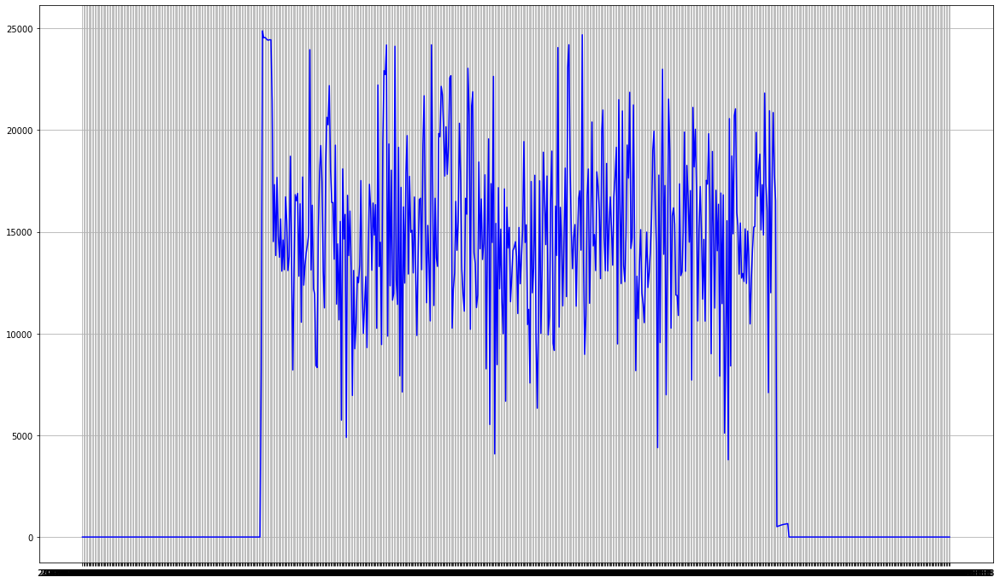

In [38]:
gr(curr, 'event_timestamp', 'Total_P', 'b')

In [47]:
ind = elec[elec['event_timestamp'].str.contains('2022-08-15', regex=False) == True].index
#anom = elec[ind[0] : ind[719]]
ind

Int64Index([], dtype='int64')

In [73]:
norm['Total_P'].mean()

8113.056425591104

In [74]:
anom['Total_P'].mean()

9028.349318497912

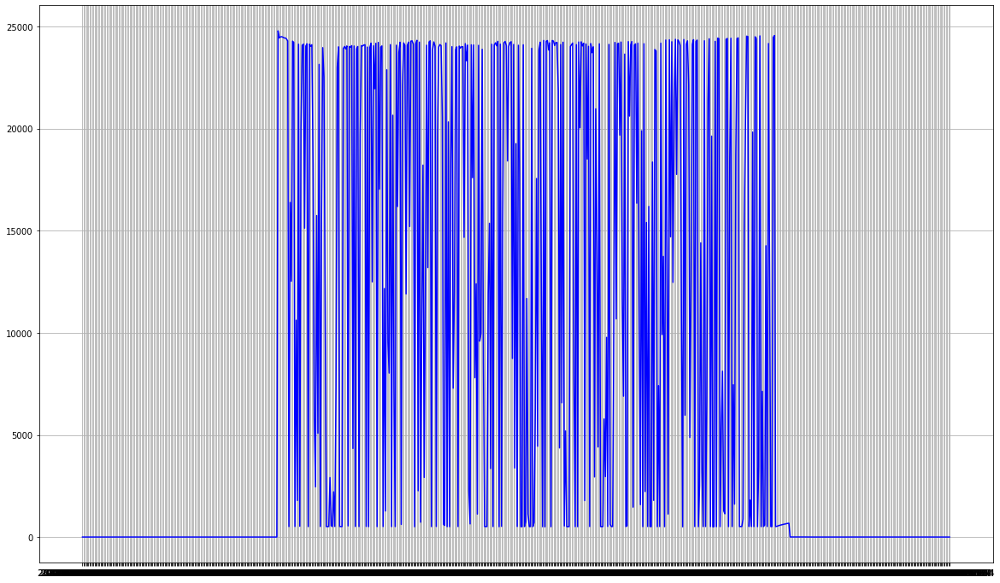

In [68]:
gr(norm, 'event_timestamp', 'Total_P', 'b')

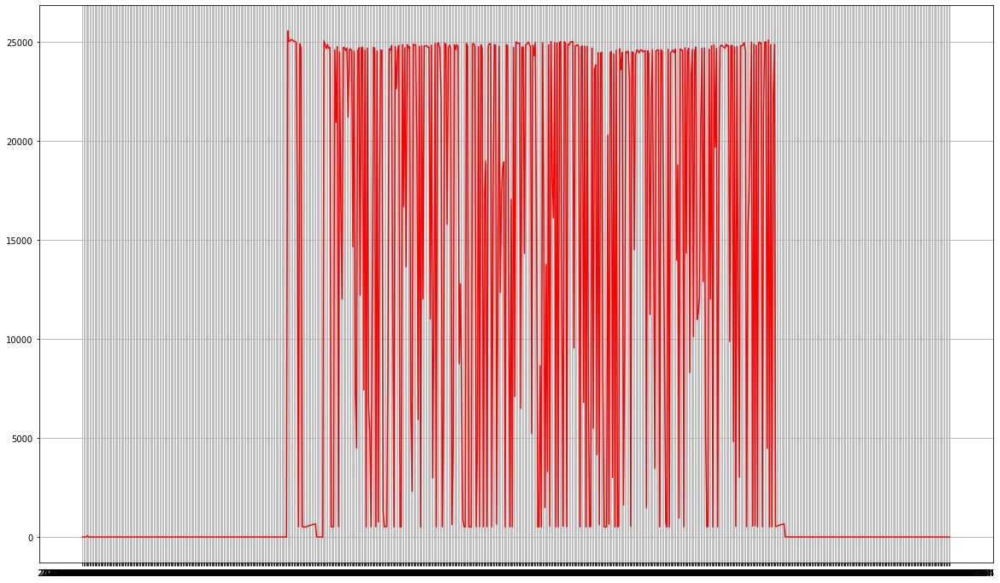

In [69]:
gr(anom, 'event_timestamp', 'Total_P', 'r')

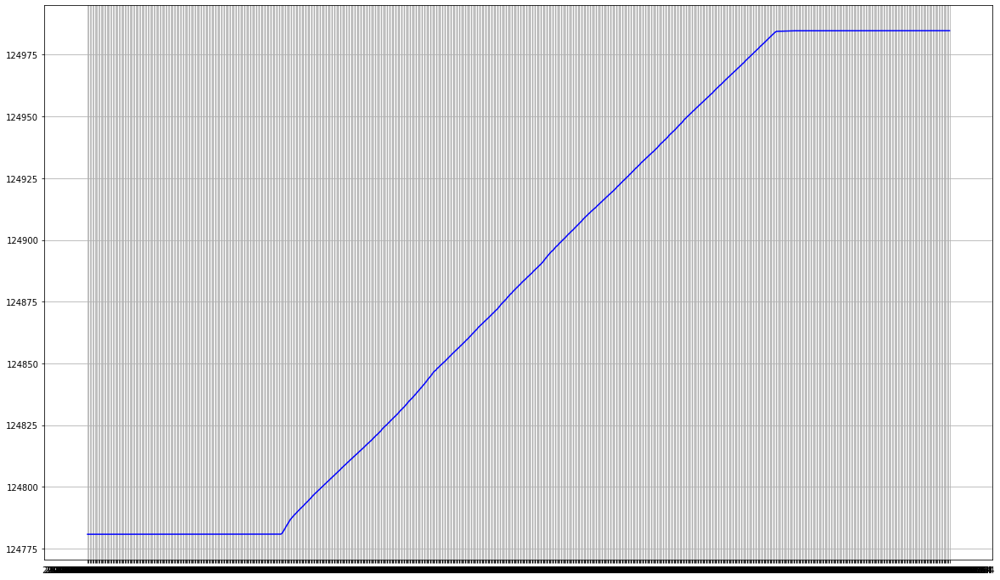

In [71]:
gr(norm, 'event_timestamp', 'Total_AP_energy', 'b')

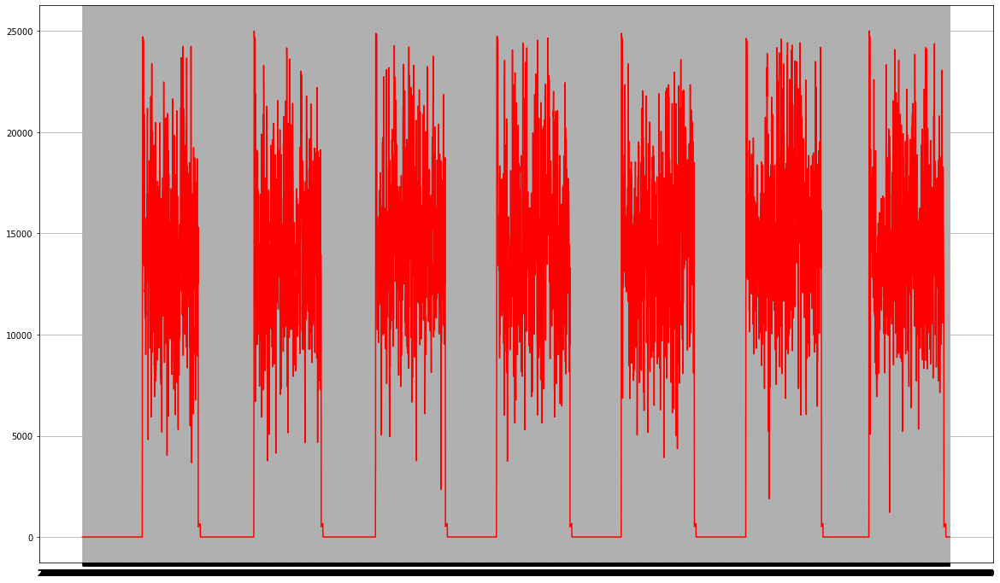

In [14]:
gr(elec[:5000], 'event_timestamp', 'Total_P', 'r')

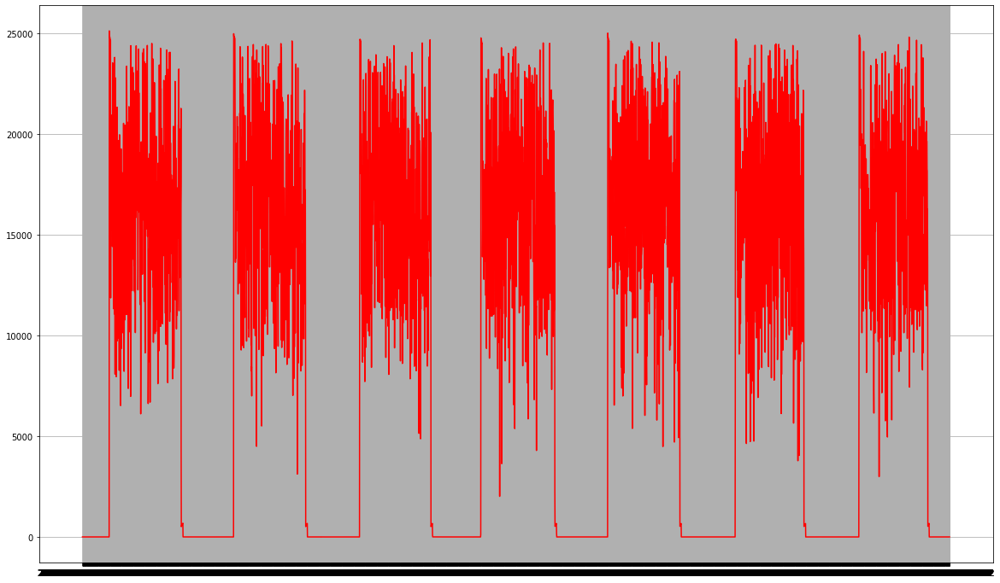

In [51]:
gr(elec[27243:32243], 'event_timestamp', 'Total_P', 'r')

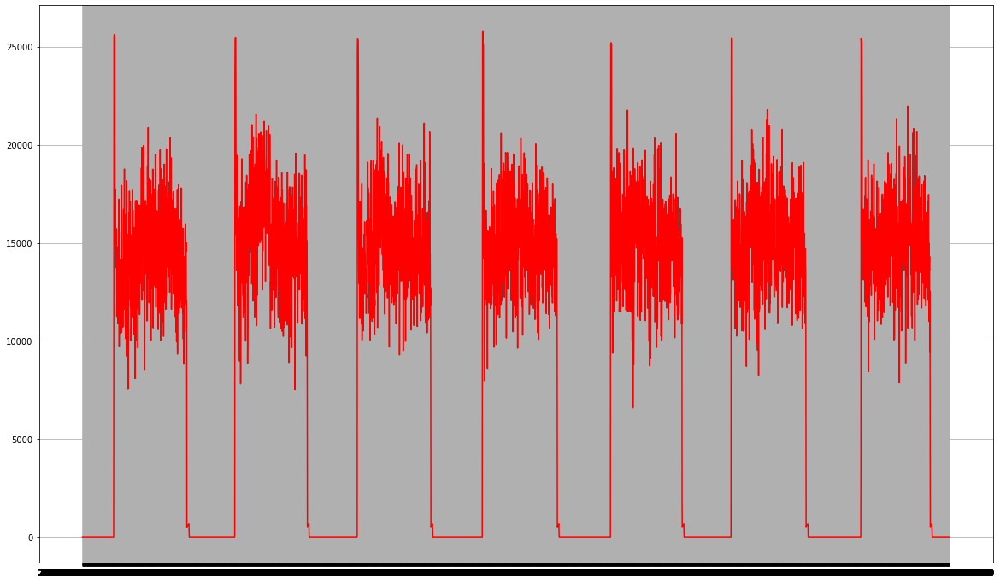

In [52]:
gr(elec[91930:96930], 'event_timestamp', 'Total_P', 'r') #май

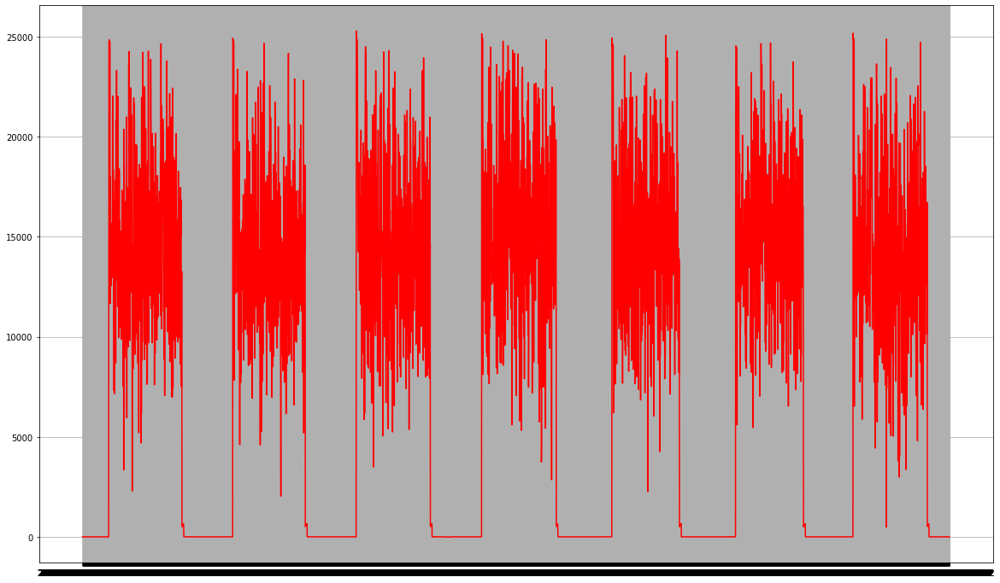

In [53]:
gr(elec[12984:17984], 'event_timestamp', 'Total_P', 'r')

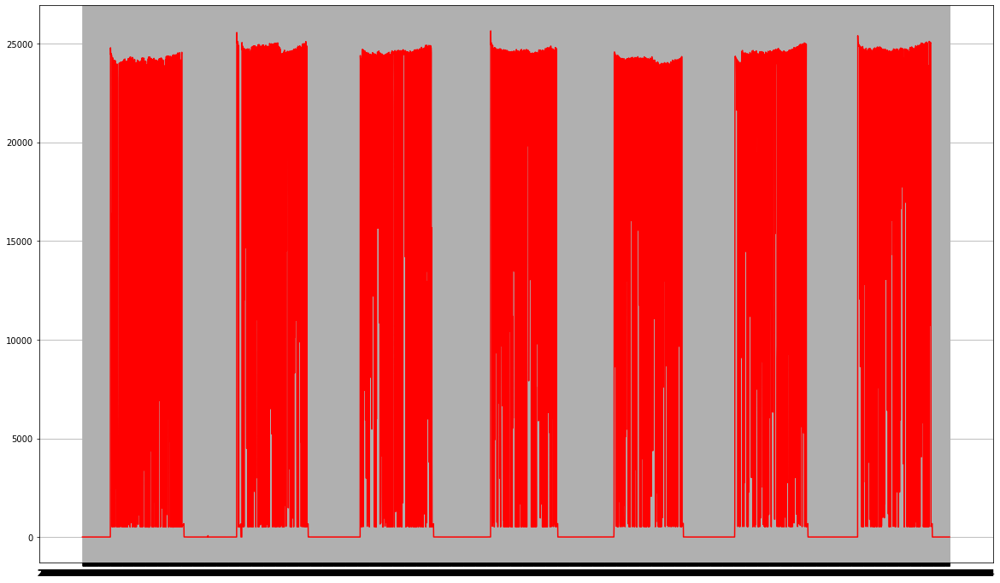

In [40]:
gr(elec[270395:275395], 'event_timestamp', 'Total_P', 'r')

In [90]:
elec[238118:241118]

,event_timestamp,io_id,Urms,Irms,P,AP_energy,RP_energy,S_energy,NP_energy,Total_P,...,S_energy_max,NP_energy_max,Total_P_max,Total_AP_energy_max,Total_RP_energy_max,Total_S_energy_max,Total_NP_energy_max,Phase_angle_max,Voltage_angle_max,Frequency_max
238118,2021-12-05 03:59:35,5e03a7a2832a17ee33585ea4,"[228.85,228.53,229.013]","[0.2,0.1,0.1]","[9.56,-0.13,0]","[40938.82947,37382.9575,37672.10531]","[319.70139,166.04913,192.81233]","[42424.05532,38627.6971,38884.5052]","[3828.7573,633.5144,567.3959]",9.43,...,"[42424.05532,38627.6971,38884.5052]","[3828.7573,633.5144,567.3959]",9.57,115993.89227999999,678.56285,119936.25762,5029.667600000001,"[-76.7,-90.1,-89.9]","[0,-120,119.9]",49.97
238119,2021-12-05 04:01:35,5e03a7a2832a17ee33585ea4,"[228.751,228.389,228.82]","[0.2,0.1,0.1]","[9.44,-0.13,0]","[40938.82979,37382.9575,37672.10531]","[319.70139,166.04913,192.81233]","[42424.05667,38627.69803,38884.50614]","[3828.7573,633.5144,567.3959]",9.309999999999999,...,"[42424.05667,38627.69803,38884.50614]","[3828.7573,633.5144,567.3959]",9.57,115993.8926,678.56285,119936.26083999999,5029.667600000001,"[-76.8,-90.1,-90]","[0,-119.9,120]",49.96
238120,2021-12-05 04:03:35,5e03a7a2832a17ee33585ea4,"[228.999,228.602,229.061]","[0.2,0.1,0.1]","[9.5,-0.06,-0.06]","[40938.8301,37382.9575,37672.10531]","[319.70139,166.04913,192.81233]","[42424.05796,38627.69893,38884.50705]","[3828.7573,633.5144,567.3959]",9.379999999999999,...,"[42424.05796,38627.69893,38884.50705]","[3828.7573,633.5144,567.3959]",9.629999999999999,115993.89291,678.56285,119936.26393999999,5029.667600000001,"[-76.7,-90.2,-89.9]","[0,-120,119.9]",49.97
238121,2021-12-05 04:05:35,5e03a7a2832a17ee33585ea4,"[228.949,228.493,229.121]","[0.2,0.1,0.1]","[9.63,-0.19,0]","[40938.83042,37382.9575,37672.10531]","[319.70139,166.04913,192.81233]","[42424.0593,38627.69987,38884.50799]","[3828.7573,633.5144,567.3959]",9.440000000000001,...,"[42424.0593,38627.69987,38884.50799]","[3828.7573,633.5144,567.3959]",9.629999999999999,115993.89323,678.56285,119936.26716,5029.667600000001,"[-76.7,-90.2,-89.9]","[0,-120,120]",49.99
238122,2021-12-05 04:07:35,5e03a7a2832a17ee33585ea4,"[228.801,228.601,229]","[0.2,0.1,0.1]","[10.31,-0.19,0]","[40938.83075,37382.9575,37672.10531]","[319.70139,166.04913,192.81233]","[42424.06064,38627.7008,38884.50892]","[3828.7573,633.5144,567.3959]",10.120000000000001,...,"[42424.06064,38627.7008,38884.50892]","[3828.7573,633.5144,567.3959]",10.18,115993.89356,678.56285,119936.27036,5029.667600000001,"[-75.8,-90.2,-89.9]","[0,-120,119.9]",49.96
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
241113,2021-12-09 07:49:35,5e03a7a2832a17ee33585ea4,"[232.835,232.007,233.606]","[6.6,4.9,4.6]","[1058.5,620.56,631.63]","[41253.9728,37668.94222,37961.40978]","[321.48383,166.0521,192.81233]","[42750.57299,38923.03944,39182.95278]","[3857.3019,637.0097,568.2697]",2310.69,...,"[42750.57299,38923.03944,39182.95278]","[3857.3019,637.0097,568.2697]",25082.98,116884.3248,680.34826,120856.56521,5062.5813,"[13.4,-0.1,-0.1]","[0,-120.1,119.9]",49.95
241114,2021-12-09 07:51:35,5e03a7a2832a17ee33585ea4,"[232.94,232.19,233.817]","[3,0.1,0.1]","[528.44,0,0.56]","[41254.14031,37669.09296,37961.56269]","[321.4849,166.0521,192.81233]","[42750.74661,38923.19506,39183.11045]","[3857.3019,637.0097,568.2697]",529,...,"[42750.74661,38923.19506,39183.11045]","[3857.3019,637.0097,568.2697]",25108.41,116884.79595999999,680.34933,120857.05212000001,5062.5813,"[12.3,-0.1,-0.1]","[0,-119.9,119.9]",49.98
241115,2021-12-09 07:53:35,5e03a7a2832a17ee33585ea4,"[232.444,232.015,233.105]","[37.1,34.9,35.2]","[8491.64,7960.2,8081.32]","[41254.31942,37669.25462,37961.72665]","[321.48592,166.0521,192.81233]","[42750.93213,38923.36198,39183.27955]","[3857.3019,637.0097,568.2697]",24533.16,...,"[42750.93213,38923.36198,39183.27955]","[3857.3019,637.0097,568.2697]",25139.47,116885.30069,680.35035,120857.57366,5062.5813,"[12.8,1.1,0.8]","[0,-120,120]",49.97
241116,2021-12-09 07:55

In [96]:
#2021
el1 = elec.Total_P[90:3090] 
el2 = elec.Total_P[22289:25289]
el3 = elec.Total_P[42270:45270]

el4 = elec.Total_P[64471:67471] 
el5 = elec.Total_P[83059:86059]
el6 = elec.Total_P[103413:106413]

el7 = elec.Total_P[124943:127943] 
el8 = elec.Total_P[146959:149959]
el9 = elec.Total_P[172823:175823]

el10 = elec.Total_P[191337:194337] 
el11 = elec.Total_P[213579:216579]
el12 = elec.Total_P[238118:241118]

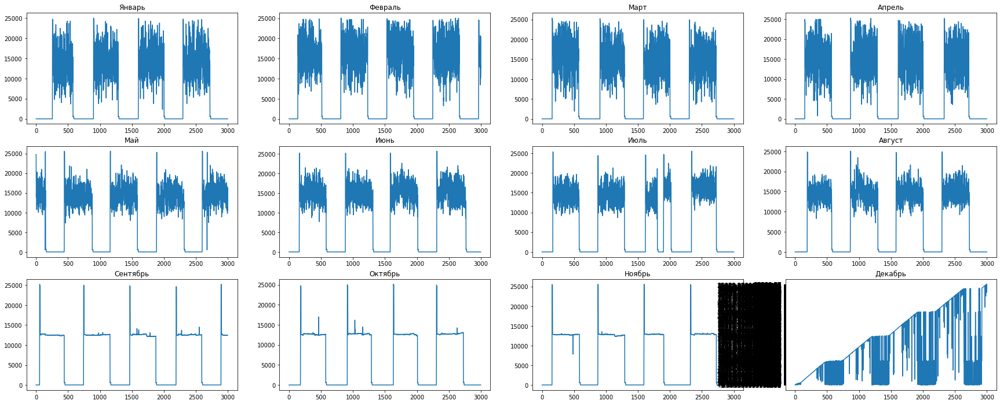

In [97]:
y = np.arange(0, 3000)
plt.figure(figsize=(30,12))
plt.subplot(3, 4, 1)
plt.title('Январь')
plt.plot(y, el1)  
plt.subplot(3, 4, 2)
plt.title('Февраль')
plt.plot(y, el2)
plt.subplot(3, 4, 3)
plt.title('Март')
plt.plot(y, el3)

plt.subplot(3, 4, 4)
plt.title('Апрель')
plt.plot(y, el4)
plt.subplot(3, 4, 5)
plt.title('Май')
plt.plot(y, el5)
plt.subplot(3, 4, 6)
plt.title('Июнь')
plt.plot(y, el6)

plt.subplot(3, 4, 7)
plt.title('Июль')
plt.plot(y, el7)
plt.subplot(3, 4, 8)
plt.title('Август')
plt.plot(y, el8)
plt.subplot(3, 4, 9)
plt.title('Сентябрь')
plt.plot(y, el9)

plt.subplot(3, 4, 10)
plt.title('Октябрь')
plt.plot(y, el10)
plt.subplot(3, 4, 11)
plt.title('Ноябрь')
plt.plot(y, el11)
plt.subplot(3, 4, 12)
plt.title('Декабрь')
plt.plot(y, el12)

plt.savefig('Total_P_year.png')

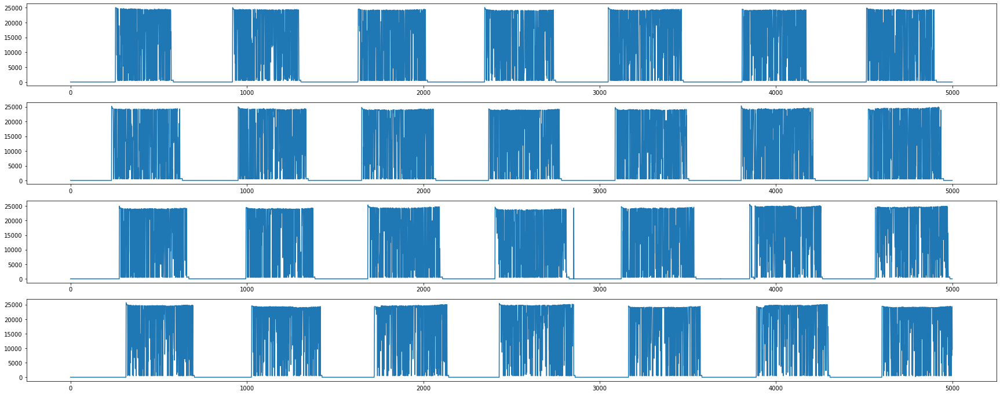

In [98]:
el1 = elec.Total_P[257434:262434] 
el2 = elec.Total_P[262434:267434]
el3 = elec.Total_P[267434:272434]
el4 = elec.Total_P[272434:277434]
y = np.arange(5000)
#el3 = elec.Total_P[257434:257434]

plt.figure(figsize=(30,12))
plt.subplot(4, 1, 1)
plt.plot(y, el1)  
plt.subplot(4, 1, 2)
plt.plot(y, el2)
plt.subplot(4, 1, 3)
plt.plot(y, el3)
plt.subplot(4, 1, 4)
plt.plot(y, el4)

plt.savefig('Total_P_2022.png')

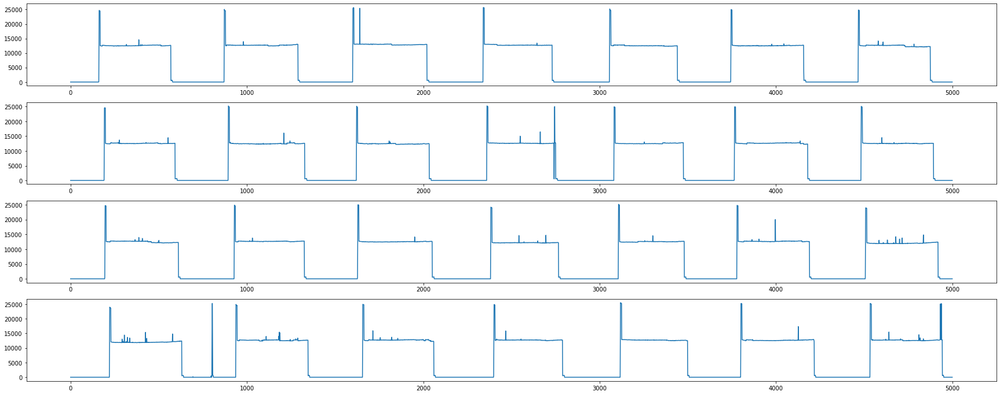

In [93]:
x = 5000
s = 169823
el1 = elec.Total_P[s:s + x] 
el2 = elec.Total_P[s + x:s + 2*x]
el3 = elec.Total_P[s + 2 *x:s + 3 * x]
el4 = elec.Total_P[s + 3 * x:s + 4*x]
y = np.arange(5000)
#el3 = elec.Total_P[257434:257434]

plt.figure(figsize=(30,12))
plt.subplot(4, 1, 1)
plt.plot(y, el1)  
plt.subplot(4, 1, 2)
plt.plot(y, el2)
plt.subplot(4, 1, 3)
plt.plot(y, el3)
plt.subplot(4, 1, 4)
plt.plot(y, el4)

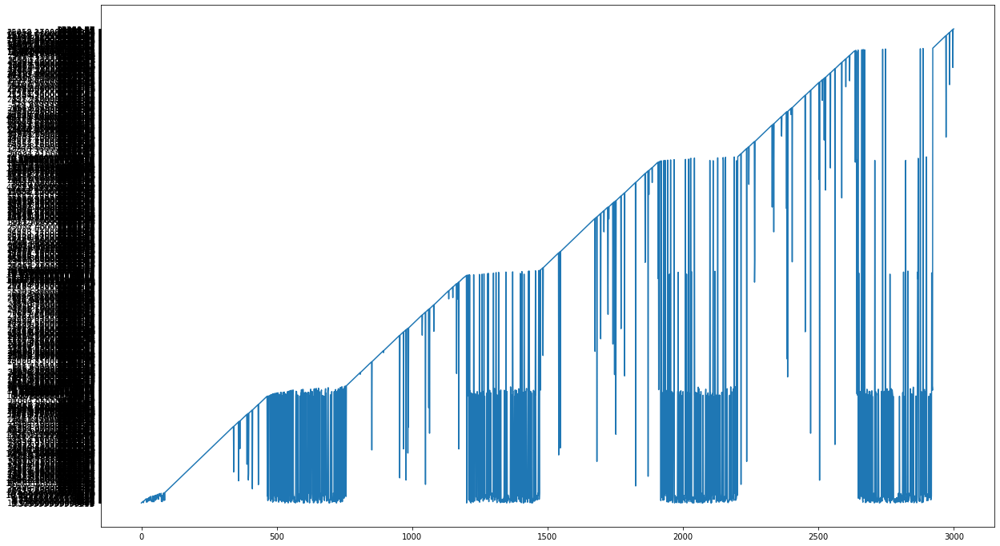

In [99]:
plt.figure(figsize=(20,12))
#plt.subplot(3, 4, 1)
y = np.arange(3000)
plt.plot(y, el12)

plt.savefig('Total_P_decemb.png')

In [82]:
off = []
for i in range(279665):
    #print(elec['Total_P'][i])
    if type(elec['Total_P'][i]) == float and elec['Total_P'][i] < 1500:
        off.append(elec['event_timestamp'][i])

In [83]:
off

['2020-12-31 21:00:33',
 '2020-12-31 21:02:33',
 '2020-12-31 21:04:33',
 '2020-12-31 21:06:33',
 '2020-12-31 21:08:33',
 '2020-12-31 21:10:33',
 '2020-12-31 21:12:33',
 '2020-12-31 21:14:33',
 '2020-12-31 21:16:33',
 '2020-12-31 21:18:33',
 '2020-12-31 21:20:33',
 '2020-12-31 21:22:33',
 '2020-12-31 21:24:33',
 '2020-12-31 21:26:33',
 '2020-12-31 21:28:33',
 '2020-12-31 21:30:33',
 '2020-12-31 21:32:33',
 '2020-12-31 21:34:33',
 '2020-12-31 21:36:33',
 '2020-12-31 21:38:33',
 '2020-12-31 21:40:33',
 '2020-12-31 21:42:33',
 '2020-12-31 21:44:33',
 '2020-12-31 21:46:33',
 '2020-12-31 21:48:33',
 '2020-12-31 21:50:33',
 '2020-12-31 21:52:33',
 '2020-12-31 21:54:33',
 '2020-12-31 21:56:33',
 '2020-12-31 21:58:33',
 '2020-12-31 22:00:33',
 '2020-12-31 22:02:33',
 '2020-12-31 22:04:33',
 '2020-12-31 22:06:33',
 '2020-12-31 22:08:33',
 '2020-12-31 22:10:33',
 '2020-12-31 22:12:33',
 '2020-12-31 22:14:33',
 '2020-12-31 22:16:33',
 '2020-12-31 22:18:33',
 '2020-12-31 22:20:33',
 '2020-12-31 22:

In [98]:
#delta = timedelta('0:30:0', '%H:%M:%S')
for i in range(len(off) - 1):
    d1 = datetime.strptime(off[i], '%Y-%m-%d %H:%M:%S')
    d2 = datetime.strptime(off[i + 1], '%Y-%m-%d %H:%M:%S')
    #print(d2-d1, (d2 - d1).total_seconds())
    if (d2 - d1).total_seconds() > 1800:
        print(off[i], off[i + 1])
        print()

2021-01-01 08:36:27 2021-01-01 19:22:27

2021-01-02 06:07:39 2021-01-02 19:13:39

2021-01-03 05:43:44 2021-01-03 19:11:44

2021-01-04 05:05:40 2021-01-04 19:13:40

2021-01-05 05:09:39 2021-01-05 19:13:39

2021-01-06 05:11:23 2021-01-06 19:45:23

2021-01-07 04:57:40 2021-01-07 08:55:40

2021-01-07 08:55:40 2021-01-07 19:23:40

2021-01-08 05:10:37 2021-01-08 19:14:37

2021-01-09 05:56:20 2021-01-09 19:22:20

2021-01-10 06:01:22 2021-01-10 19:17:22

2021-01-11 05:03:56 2021-01-11 12:57:56

2021-01-11 12:57:56 2021-01-11 19:09:56

2021-01-12 05:09:26 2021-01-12 19:25:26

2021-01-13 04:59:38 2021-01-13 19:13:38

2021-01-14 05:05:50 2021-01-14 19:15:50

2021-01-15 05:10:16 2021-01-15 08:38:16

2021-01-15 08:38:16 2021-01-15 19:40:16

2021-01-16 05:47:29 2021-01-16 16:41:29

2021-01-16 16:41:29 2021-01-16 19:39:29

2021-01-17 06:08:31 2021-01-17 19:36:31

2021-01-18 05:10:35 2021-01-18 19:16:35

2021-01-19 05:08:12 2021-01-19 19:22:12

2021-01-20 05:12:36 2021-01-20 19:12:36

2021-01-21 05:04

# 0_data_meter_humidity.csv

In [7]:
hum

,event_timestamp,io_id,value,value_min,value_max
0,1610136637,5e03a7a4832a17ee33585eb0,35.89,35.89,35.89
1,1610283082,5e03a7a4832a17ee33585eb0,35.89,35.89,35.89
2,1612209511,5e03a7a4832a17ee33585eb0,35.89,35.89,35.89
3,1613705374,5e03a7a4832a17ee33585eb0,35.89,35.89,35.89
4,1615915770,5e03a7a4832a17ee33585eb0,35.89,35.89,35.89
...,...,...,...,...,...
193251,1643662314,5e03a7a4832a17ee33585eb0,23.69,23.69,23.69
193252,1643662434,5e03a7a4832a17ee33585eb0,23.47,23.47,23.69
193253,1643662554,5e03a7a4832a17ee33585eb0,23.47,23.47,23.47
193254,1643662674,5e03a7a4832a17ee33585eb0,23.47,23.47,23.47


# 0_data_meter_temperature.csv

In [10]:
temp

,event_timestamp,io_id,value,value_min,value_max
0,2021-01-08 20:10:37,5e03a7a4832a17ee33585eaf,30.38,30.38,30.38
1,2021-01-10 12:51:22,5e03a7a4832a17ee33585eaf,30.38,30.38,30.38
2,2021-02-01 19:58:31,5e03a7a4832a17ee33585eaf,30.38,30.38,30.38
3,2021-02-19 03:29:34,5e03a7a4832a17ee33585eaf,30.38,30.38,30.38
4,2021-03-16 17:29:30,5e03a7a4832a17ee33585eaf,30.38,30.38,30.38
...,...,...,...,...,...
193261,2022-01-31 20:51:54,5e03a7a4832a17ee33585eaf,24.65,24.65,24.65
193262,2022-01-31 20:53:54,5e03a7a4832a17ee33585eaf,24.13,24.13,24.65
193263,2022-01-31 20:55:54,5e03a7a4832a17ee33585eaf,24.13,24.13,24.13
193264,2022-01-31 20:57:54,5e03a7a4832a17ee33585eaf,24.13,24.13,24.13


In [23]:
elec[86100:]

,event_timestamp,io_id,Urms,Irms,P,AP_energy,RP_energy,S_energy,NP_energy,Total_P,...,S_energy_max,NP_energy_max,Total_P_max,Total_AP_energy_max,Total_RP_energy_max,Total_S_energy_max,Total_NP_energy_max,Phase_angle_max,Voltage_angle_max,Frequency_max
86100,2021-05-07 19:58:17,5e03a7a2832a17ee33585ea4,"[233.840864864865,233.717081081081,233.8509729...","[0.2,0.1,0.1]","[9.41782608695652,-0.245454545454545,0]","[25129.658245,23055.00549,23243.55414]",[],[],[],9.172372,...,[],[],9.43,71428.21803,\N,\N,\N,"[-77.5,-90.2,-89.9]","[0,-119.9,119.9]",49.98
86101,2021-05-07 20:00:17,5e03a7a2832a17ee33585ea4,"[233.838166666667,233.670861111111,233.8684444...","[0.2,0.1,0.1]","[10.1130434782609,-0.293157894736842,-0.012]","[25129.6585758064,23055.00549,23243.55414]",[],[],[],9.807886,...,[],[],10.43,71428.21837,\N,\N,\N,"[-76.4,-90.3,-89.9]","[0,-119.9,119.9]",50.0
86102,2021-05-07 20:02:17,5e03a7a2832a17ee33585ea4,"[233.967444444444,233.915805555556,233.9750277...","[0.2,0.1,0.1]","[10.2488888888889,-0.289285714285714,0.03]","[25129.6589106452,23055.00549,23243.55414]",[],[],[],9.989603,...,[],[],10.25,71428.21871,\N,\N,\N,"[-76.4,-90.4,-89.9]","[0,-120,119.9]",50.0
86103,2021-05-07 20:04:17,5e03a7a2832a17ee33585ea4,"[234.027083333333,234.012638888889,233.9556388...","[0.2,0.1,0.1]","[9.93037037037037,-0.237142857142857,0]","[25129.6592545161,23055.00549,23243.55414]",[],[],[],9.693228,...,[],[],10.25,71428.21905,\N,\N,\N,"[-76.4,-90.3,-89.9]","[0,-120,119.9]",49.99
86104,2021-05-07 20:06:17,5e03a7a2832a17ee33585ea4,"[231.726459459459,231.818405405405,231.7450270...","[0.2,0.1,0.1]","[9.48357142857143,-0.19,-0.03]","[25129.6595822222,23055.00549,23243.55414]",[],[],[],9.263571,...,[],[],9.56,71428.21936,\N,\N,\N,"[-77.1,-90.2,-89.9]","[0,-120,119.9]",49.97
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
279660,2022-01-31 20:51:54,5e03a7a2832a17ee33585ea4,"[230.144,230.034,230.427]","[0.2,0.1,0.1]","[9.88,-0.25,0.06]","[45109.13062,41172.24145,41483.49999]","[344.03577,166.16952,192.81239]","[46750.14248,42543.40906,42818.74515]","[4212.0699,704.8758,580.5031]",9.69,...,"[46750.14248,42543.40906,42818.74515]","[4212.0699,704.8758,580.5031]",10.12,127764.87206,703.01768,132112.29669,5497.4488,"[-76.4,-90.4,-89.9]","[0,-120.1,119.7]",49.98
279661,2022-01-31 20:53:54,5e03a7a2832a17ee33585ea4,"[230.225,230.125,230.528]","[0.2,0.1,0.1]","[10.06,-0.13,0]","[45109.13095,41172.24145,41483.49999]","[344.03577,166.16952,192.81239]","[46750.14379,42543.40997,42818.74606]","[4212.0699,704.8758,580.5031]",9.93,...,"[46750.14379,42543.40997,42818.74606]","[4212.0699,704.8758,580.5031]",10.13,127764.87239,703.01768,132112.29982,5497.4488,"[-76.4,-90.4,-89.8]","[0,-120.3,119.5]",49.97
279662,2022-01-31 20:55:54,5e03a7a2832a17ee33585ea4,"[230.449,230.165,230.52]","[0.2,0.1,0.1]","[9.69,-0.25,0]","[45109.13128,41172.24145,41483.49999]","[344.03577,166.16952,192.81239]","[46750.14515,42543.41092,42818.74702]","[4212.0699,704.8758,580.5031]",9.44,...,"[46750.14515,42543.41092,42818.74702]","[4212.0699,704.8758,580.5031]",9.99,127764.87272,703.01768,132112.30309,5497.4488,"[-76.5,-90.3,-89.9]","[0,-120.2,119.6]",50.0
279663,2022-01-31 20:57:54,5e03a7a2832a17ee33585ea4,"[230.549,230.305,230.686]","[0.2,0.1,0.1]","[9.75,-0.19,0]","[45109.13161,41172.24145,41483.49999]","[344.03577,166.16952,192.81239]","[46750.1465,42543.41186,42818.74797]","[4212.0699,704.8758,580.5031]",9.56,...,"[46750.1465,42543.41186,42818.74797]","[4212.0699,704.8758,580.5031]",9.87,127764.87305,703.01768,132112.30633,5497.4488,"[-76.6,-90.3,-89.9]","[0,-120.2,119.6]",50.03


In [9]:
for i, j in enumerate(temp['event_timestamp']):
    #print(j)
    temp['event_timestamp'][i] = datetime.utcfromtimestamp(j).strftime('%Y-%m-%d %H:%M:%S')

<ipython-input-9-1bdaacc53f35>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp['event_timestamp'][i] = datetime.utcfromtimestamp(j).strftime('%Y-%m-%d %H:%M:%S')
c:\users\lomonosova\appdata\local\programs\python\python38\lib\site-packages\pandas\core\indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


In [9]:
case

,id,description,equipment_id,facility_id
0,0,Неправильно собранное оборудование (печь) посл...,5e03a7a7832a17ee33585ecf,5e03a79d832a17ee33585e8a


In [14]:
case['description'][0]

'Неправильно собранное оборудование (печь) после обслуживания. 19.01.2022 – корректная работа оборудования, 20.01.2022 – повышенное энергопотребление.'

In [10]:
equipment

,id,io_id,weight
0,5e03a7a7832a17ee33585ecf,5e03a7a2832a17ee33585ea4,1


In [11]:
facility

,id,io_id,type
0,5e03a79d832a17ee33585e8a,5e03a7a4832a17ee33585eaf,meter_temperature
1,5e03a79d832a17ee33585e8a,5e03a7a4832a17ee33585eb0,meter_humidity


In [19]:
data = pd.DataFrame({'date': [], 'time': [], 'Total_P':[], 'temp': [], 'hum': []})

In [20]:
data

,date,time,Total_P,temp,hum


In [25]:
t = np.array(temp['event_timestamp'])
e = np.array(elec['event_timestamp'])

In [29]:
for i in range(e.shape[0]):
    for j in range(t.shape[0]):

<ipython-input-29-6fe0b6c035a1>:1: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  t == e


False

In [28]:
t

array(['2021-01-08 20:10:37', '2021-01-10 12:51:22',
       '2021-02-01 19:58:31', ..., '2022-01-31 20:55:54',
       '2022-01-31 20:57:54', '2022-01-31 20:59:54'], dtype=object)

Что надо сделать:
Соединить данные и поиграть с графиками

# Total_AP_max

In [8]:
elec.columns

Index(['event_timestamp', 'io_id', 'Urms', 'Irms', 'P', 'AP_energy',
       'RP_energy', 'S_energy', 'NP_energy', 'Total_P', 'Total_AP_energy',
       'Total_RP_energy', 'Total_S_energy', 'Total_NP_energy', 'Phase_angle',
       'Voltage_angle', 'Frequency', 'Urms_min', 'Irms_min', 'P_min',
       'AP_energy_min', 'RP_energy_min', 'S_energy_min', 'NP_energy_min',
       'Total_P_min', 'Total_AP_energy_min', 'Total_RP_energy_min',
       'Total_S_energy_min', 'Total_NP_energy_min', 'Phase_angle_min',
       'Voltage_angle_min', 'Frequency_min', 'Urms_max', 'Irms_max', 'P_max',
       'AP_energy_max', 'RP_energy_max', 'S_energy_max', 'NP_energy_max',
       'Total_P_max', 'Total_AP_energy_max', 'Total_RP_energy_max',
       'Total_S_energy_max', 'Total_NP_energy_max', 'Phase_angle_max',
       'Voltage_angle_max', 'Frequency_max'],
      dtype='object')

In [315]:
t = elec['event_timestamp']
t = pd.to_datetime(t)
dt = []
for i, j in enumerate(t):
    i += 1
    try:
        dt.append(t[i] - t[i - 1])
    except KeyError:
        continue
        
for i in range(len(dt)):
    dt[i] = dt[i].total_seconds()
dt = np.array(dt)
dt[np.where(dt == 0)] = 0.001

AP = elec['Total_AP_energy_max']
a = []
for j, i in enumerate(elec['Total_AP_energy_max'][:279664]):
    try:
        i = float(i)
    except ValueError:
        a.append(j)
for i in a:
    AP[i] = AP[i - 1]
AP = np.array(AP, dtype = float)
dAP = -1 * AP[:-1] + AP[1:]
dAP *= 1000
X = dAP/dt

In [316]:
el1 = X[90:3090] 
el2 = X[22289:25289]
el3 = X[42270:45270]

el4 = X[64471:67471] 
el5 = X[83059:86059]
el6 = X[103413:106413]

el7 = X[124943:127943] 
el8 = X[146959:149959]
el9 = X[172823:175823]

el10 = X[191337:194337] 
el11 = X[213579:216579]
el12 = X[238118:241118]

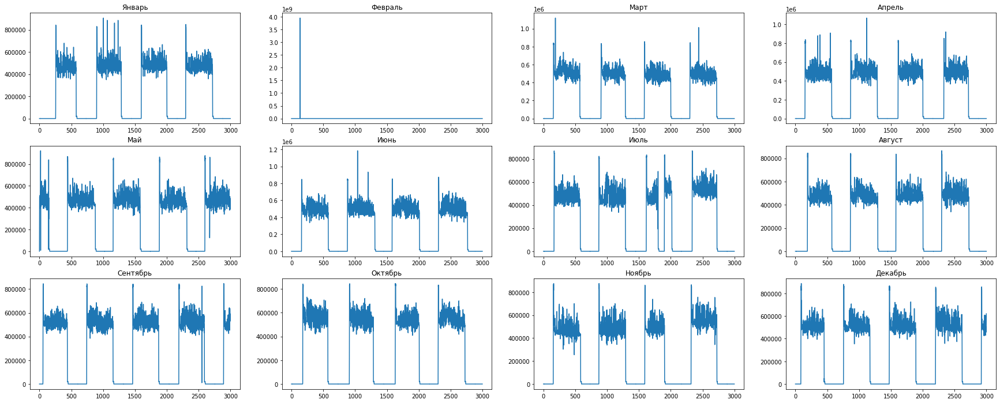

In [317]:
y = np.arange(0, 3000)
plt.figure(figsize=(30,12))
plt.subplot(3, 4, 1)
plt.title('Январь')
plt.plot(y, el1)  
plt.subplot(3, 4, 2)
plt.title('Февраль')
plt.plot(y, el2)
plt.subplot(3, 4, 3)
plt.title('Март')
plt.plot(y, el3)

plt.subplot(3, 4, 4)
plt.title('Апрель')
plt.plot(y, el4)
plt.subplot(3, 4, 5)
plt.title('Май')
plt.plot(y, el5)
plt.subplot(3, 4, 6)
plt.title('Июнь')
plt.plot(y, el6)

plt.subplot(3, 4, 7)
plt.title('Июль')
plt.plot(y, el7)
plt.subplot(3, 4, 8)
plt.title('Август')
plt.plot(y, el8)
plt.subplot(3, 4, 9)
plt.title('Сентябрь')
plt.plot(y, el9)

plt.subplot(3, 4, 10)
plt.title('Октябрь')
plt.plot(y, el10)
plt.subplot(3, 4, 11)
plt.title('Ноябрь')
plt.plot(y, el11)
plt.subplot(3, 4, 12)
plt.title('Декабрь')
plt.plot(y, el12)

#plt.savefig('AP_max_year.png')

<ipython-input-313-22e1cb0054da>:88: RuntimeWarning: divide by zero encountered in true_divide
  X = dAP/dt
<ipython-input-313-22e1cb0054da>:88: RuntimeWarning: invalid value encountered in true_divide
  X = dAP/dt


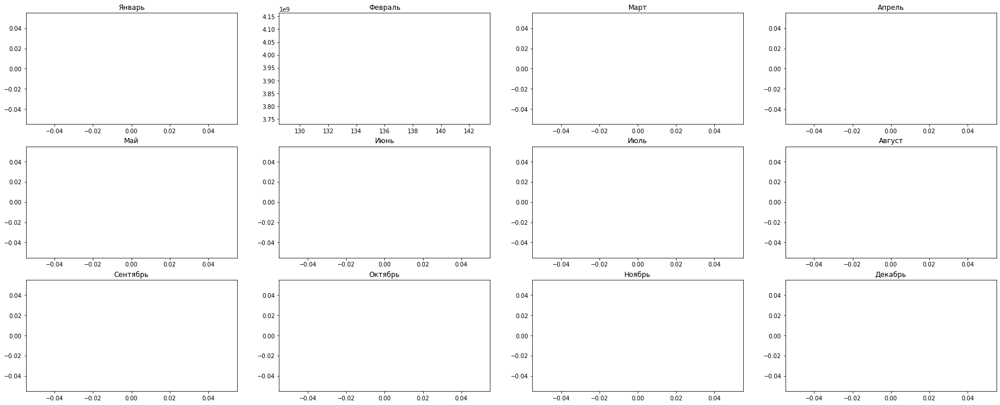

In [313]:
AP = elec['Total_AP_energy_max']#np.array(elec['Total_AP_energy_max'][:279664]) - np.array(elec['Total_AP_energy_max'][1:])
t = elec['event_timestamp']


# In[42]:


a = []
#AP[28618] = AP[28618 - 1]
for j, i in enumerate(elec['Total_AP_energy_max'][:279664]):
    #print(j, i)
    try:
        i = float(i)
    except ValueError:
        a.append(j)
    #if type(i) != float:
        #print(i)


# In[43]:


for i in a:
    AP[i] = AP[i - 1]


# 152677,2021-08-08 19:24:00 - 153242,2021-08-09 04:54:00

# In[44]:


AP = np.array(AP, dtype = float)


# In[47]:


dAP = -1 * AP[:-1] + AP[1:]


# In[48]:


dAP


# In[61]:


#t_dt = datetime.strptime(t, '%Y-%m-%d %h:%M:%s')
t = pd.to_datetime(t)
t


# In[62]:


dt = []
for i, j in enumerate(t):
    i += 1
    try:
        dt.append(t[i] - t[i - 1])
    except KeyError:
        continue

# In[66]:


for i in range(len(dt)):
    dt[i] = dt[i].total_seconds()


# In[68]:


len(dt)


# In[72]:


dAP *= 1000


# In[73]:


X = dAP/dt


# In[74]:


X


# In[77]:


el1 = X[90:3090] 
el2 = X[22289:25289]
el3 = X[42270:45270]

el4 = X[64471:67471] 
el5 = X[83059:86059]
el6 = X[103413:106413]

el7 = X[124943:127943] 
el8 = X[146959:149959]
el9 = X[172823:175823]

el10 = X[191337:194337] 
el11 = X[213579:216579]
el12 = X[238118:241118]


# In[79]:


y = np.arange(0, 3000)
plt.figure(figsize=(30,12))
plt.subplot(3, 4, 1)
plt.title('Январь')
plt.plot(y, el1)  
plt.subplot(3, 4, 2)
plt.title('Февраль')
plt.plot(y, el2)
plt.subplot(3, 4, 3)
plt.title('Март')
plt.plot(y, el3)

plt.subplot(3, 4, 4)
plt.title('Апрель')
plt.plot(y, el4)
plt.subplot(3, 4, 5)
plt.title('Май')
plt.plot(y, el5)
plt.subplot(3, 4, 6)
plt.title('Июнь')
plt.plot(y, el6)

plt.subplot(3, 4, 7)
plt.title('Июль')
plt.plot(y, el7)
plt.subplot(3, 4, 8)
plt.title('Август')
plt.plot(y, el8)
plt.subplot(3, 4, 9)
plt.title('Сентябрь')
plt.plot(y, el9)

plt.subplot(3, 4, 10)
plt.title('Октябрь')
plt.plot(y, el10)
plt.subplot(3, 4, 11)
plt.title('Ноябрь')
plt.plot(y, el11)
plt.subplot(3, 4, 12)
plt.title('Декабрь')
plt.plot(y, el12)


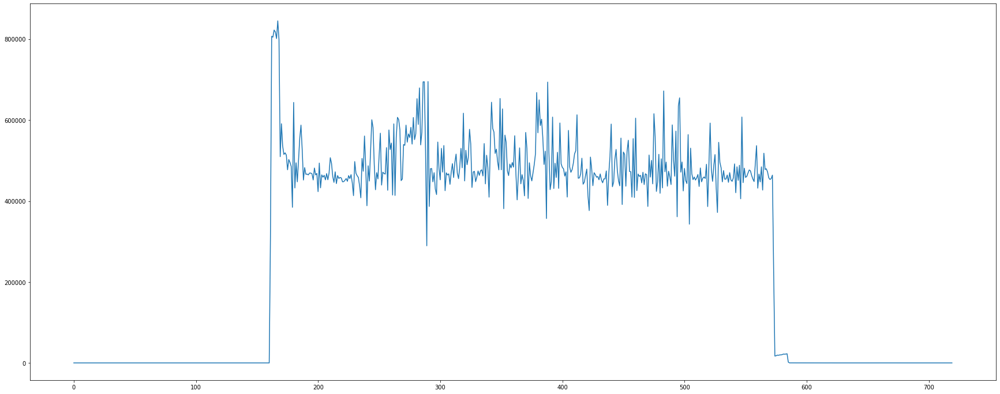

In [311]:
norm = X[270395:270395 + 720]
y = np.arange(720)
plt.figure(figsize=(30,12))
plt.plot(y, norm)

#plt.savefig('AP_max_norm.png')

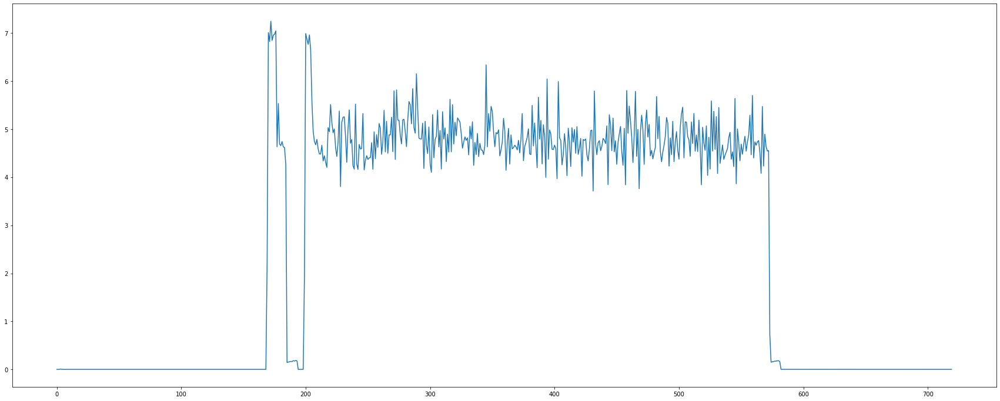

In [88]:
anom = X[270395 + 720:270395 + 2 *720]
y = np.arange(720)
plt.figure(figsize=(30,12))
plt.plot(y, anom)
#plt.savefig('AP_max_anom.png')

In [82]:
norm.mean()

2.360136458333323

In [83]:
anom.mean()

2.6257032407406933

In [85]:
norm[np.where(norm > 1)].mean()

4.107953793381519

In [86]:
anom[np.where(anom > 1)].mean()

4.835971581196334

ValueError: x and y must have same first dimension, but have shapes (5000,) and (4539,)

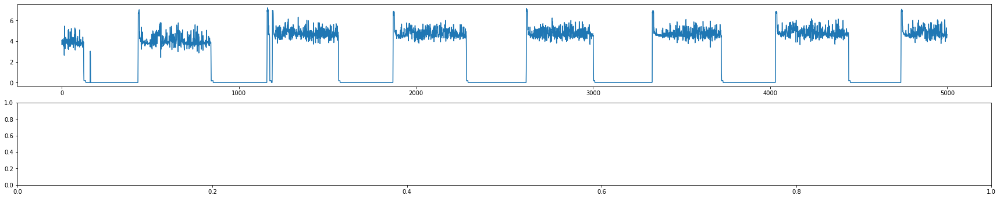

In [100]:
x = 5000
s = 270125
el1 = X[s:s + x] 
el2 = X[s + x:s + 2*x]
el3 = X[s + 2 *x:s + 3 * x]
el4 = X[s + 3 * x:s + 4*x]
y = np.arange(5000)
#el3 = elec.Total_P[257434:257434]

plt.figure(figsize=(30,12))
plt.subplot(4, 1, 1)
plt.plot(y, el1)  
plt.subplot(4, 1, 2)
plt.plot(y, el2)
plt.subplot(4, 1, 3)
plt.plot(y, el3)
plt.subplot(4, 1, 4)
plt.plot(y, el4)

# K-means

X - нужное значение total AP max

In [150]:
X[np.where(np.isnan(X) == True)] = 0

In [256]:
#X = X[:100000]
X = X[124943:127943]
X.shape

(3000,)

In [251]:
h_time = []
for i in t:
    #i += 1
    h_time.append(i.hour)


In [252]:
type(X[10])

IndexError: index 10 is out of bounds for axis 0 with size 0

In [175]:
for i in X:
    if type(i) != np.float64:
        print(111, i)

In [257]:
z = np.array(np.column_stack([X, h_time[124943:127943]]))

In [258]:
km = KMeans(n_clusters=2, random_state=0).fit(z)

In [178]:
np.any(np.isnan(z))

False

In [179]:
np.all(np.isfinite(z))

True

In [259]:
pred = km.predict(z)

In [181]:
#np.where(pred == 0)
pred.sum()

57142

In [182]:
z

array([[2.75000002e+00, 2.10000000e+01],
       [2.58333336e+00, 2.10000000e+01],
       [2.66666666e+00, 2.10000000e+01],
       ...,
       [6.91541667e+03, 5.00000000e+00],
       [6.69708333e+03, 5.00000000e+00],
       [4.28850000e+03, 5.00000000e+00]])

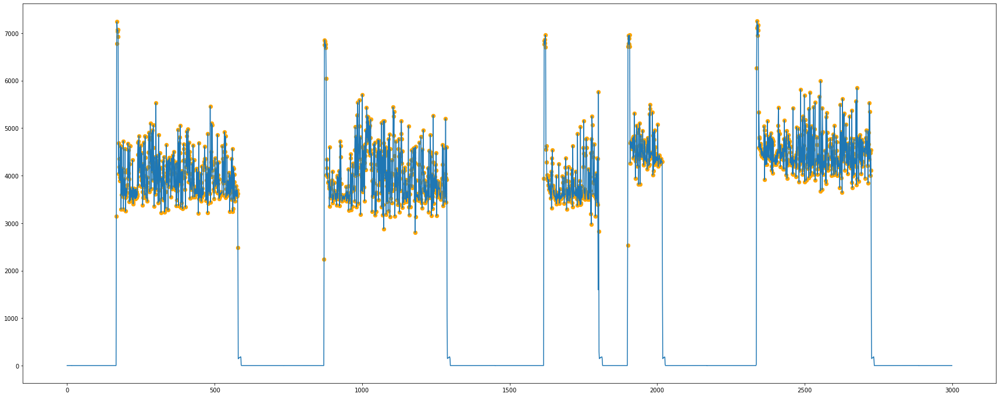

In [261]:
delta = 3000
y = np.arange(delta)
plt.figure(figsize=(30,12))
plt.plot(y, X[:delta])
plt.scatter(y[np.where(pred[:delta] == 1)], X[np.where(pred[:delta] == 1)], color='orange', s=40, marker='o')

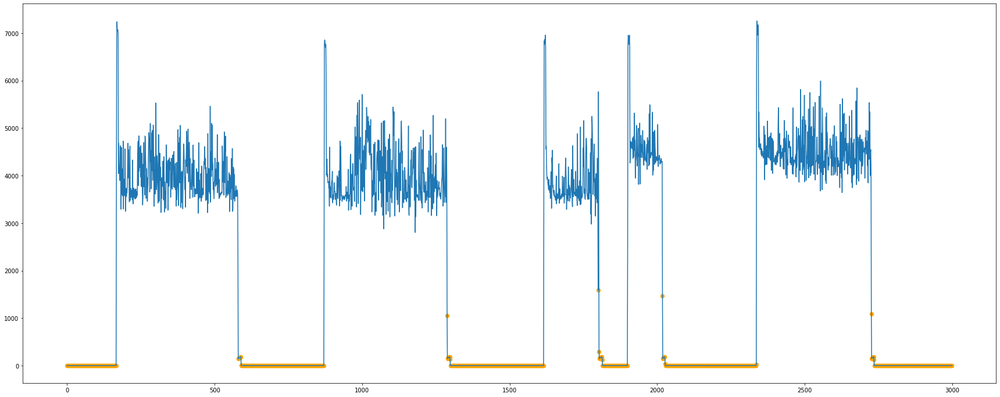

In [262]:
plt.figure(figsize=(30,12))
plt.plot(y, X[:delta])
plt.scatter(y[np.where(pred[:delta] == 0)], X[np.where(pred[:delta] == 0)], color='orange', s=40, marker='o')

Данные: [total_AP_max, час в сутках]\
Алгоритм: KMeans\
Выводы: аномалии выделяются во второй половине дня (нужно сделать one hot encoding)\
Применять алгоритм только в часы работы (!) может быть плохой идеей для решения с другими видами оборудования \
Применить скользящее окно

# One hot encoding

In [103]:
enc_time = []
for i in h_time:
    curr = np.zeros(24)
    curr[i] = 1
    enc_time.append(curr)

In [106]:
z = np.array(np.column_stack([X, enc_time[:100000]]))

In [110]:
km = KMeans(n_clusters=2, random_state=0).fit(z)
pred = km.predict(z)

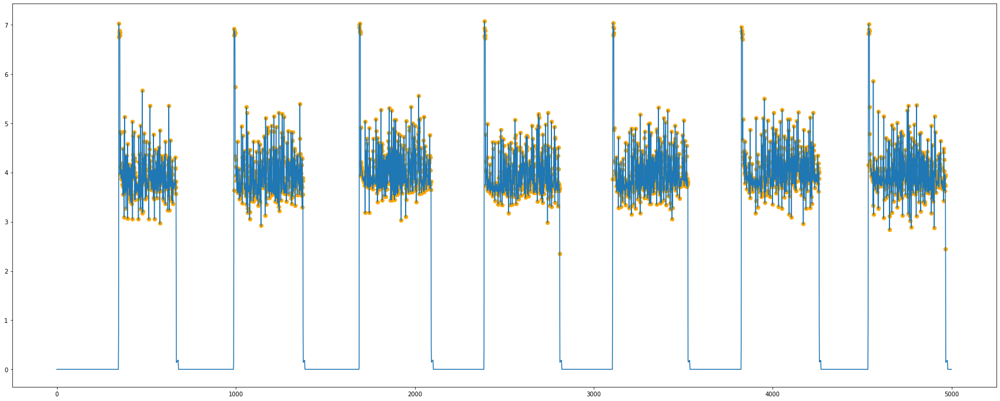

In [114]:
delta = 5000
y = np.arange(delta)
plt.figure(figsize=(30,12))
plt.plot(y, X[:delta])
plt.scatter(y[np.where(pred[:delta] == 0)], X[np.where(pred[:delta] == 0)], color='orange', s=40, marker='o')

# Скользящее окно

In [132]:
WS = 40
km = KMeans(n_clusters=2, random_state=0).fit(z)
#fcm.fit(X)
#ans_soft = np.zeros((X.shape[0], 2))
ans = np.zeros(X.shape[0])
for i in range(X.shape[0] - WS):
    curr_z = z[i : i + WS]
    #pred_soft = fcm.soft_predict(curr_x)
    pred = km.predict(curr_z)
    #ans_soft[i : i + WS] += pred_soft
    ans[i : i + WS] += pred
    
for i in range(WS):
    #ans_soft[i] /= (i + 1)
    #ans_soft[ans_soft.shape[0] - (i + 1)] /= (i + 1)
    ans[i] /= (i + 1)
    ans[ans.shape[0] - (i + 1)] /= (i + 1)
#ans_soft[WS:-WS] /= WS
ans[WS:-WS] /= WS
ans[ans >= 0.5] = 1
ans[ans < 0.5] = 0

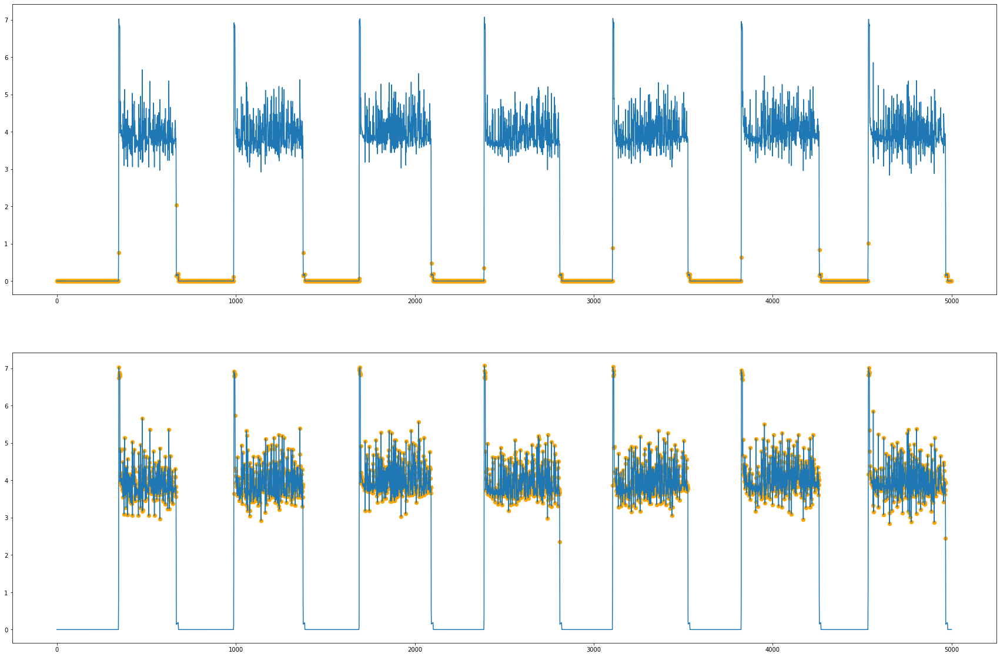

In [137]:
delta = 5000
y = np.arange(delta)
plt.figure(figsize=(30,20))
plt.subplot(2, 1, 1)
plt.plot(y, X[:delta])
plt.scatter(y[np.where(ans[:delta] == 1)], X[np.where(ans[:delta] == 1)], color='orange', s=40, marker='o')
plt.subplot(2, 1, 2)
plt.plot(y, X[:delta])
plt.scatter(y[np.where(ans[:delta] == 0)], X[np.where(ans[:delta] == 0)], color='orange', s=40, marker='o')

In [140]:
WS = 100
km = KMeans(n_clusters=2, random_state=0).fit(z)

ans = np.zeros(X.shape[0])
for i in range(X.shape[0] - WS):
    curr_z = z[i : i + WS]
    pred = km.predict(curr_z)
    ans[i : i + WS] += pred
    
for i in range(WS):
    ans[i] /= (i + 1)
    ans[ans.shape[0] - (i + 1)] /= (i + 1)

ans[WS:-WS] /= WS
ans[ans >= 0.5] = 1
ans[ans < 0.5] = 0

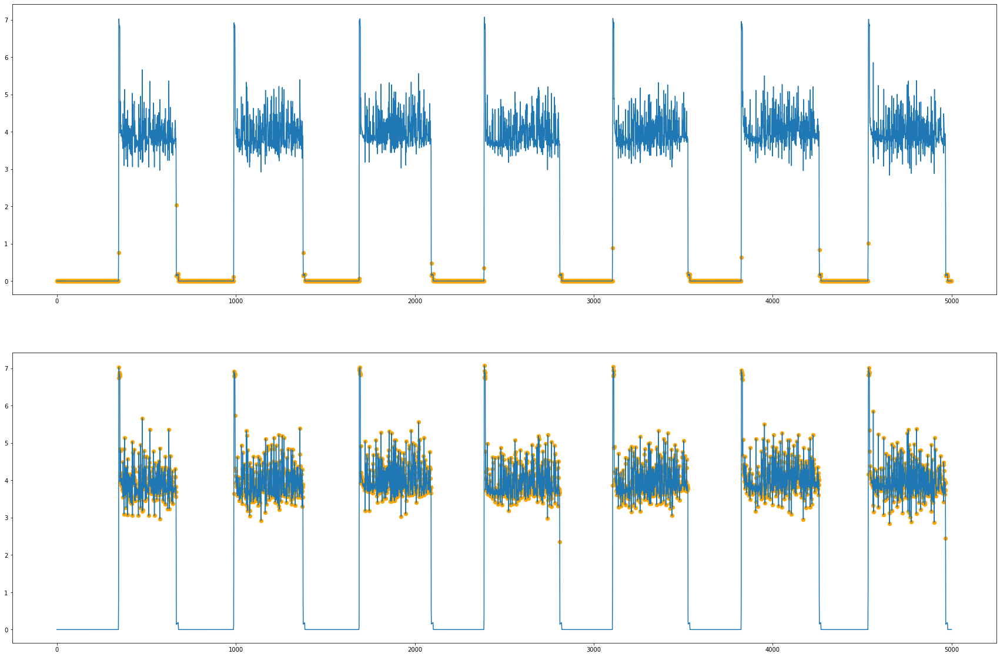

In [141]:
delta = 5000
y = np.arange(delta)
plt.figure(figsize=(30,20))
plt.subplot(2, 1, 1)
plt.plot(y, X[:delta])
plt.scatter(y[np.where(ans[:delta] == 1)], X[np.where(ans[:delta] == 1)], color='orange', s=40, marker='o')
plt.subplot(2, 1, 2)
plt.plot(y, X[:delta])
plt.scatter(y[np.where(ans[:delta] == 0)], X[np.where(ans[:delta] == 0)], color='orange', s=40, marker='o')

# Часы работы: усреднить, когда выкл

In [144]:
X[np.where(X < 1)] = 4

In [146]:
z = np.array(np.column_stack([X, enc_time[:100000]]))

In [147]:
km = KMeans(n_clusters=2, random_state=0).fit(z)
pred = km.predict(z)

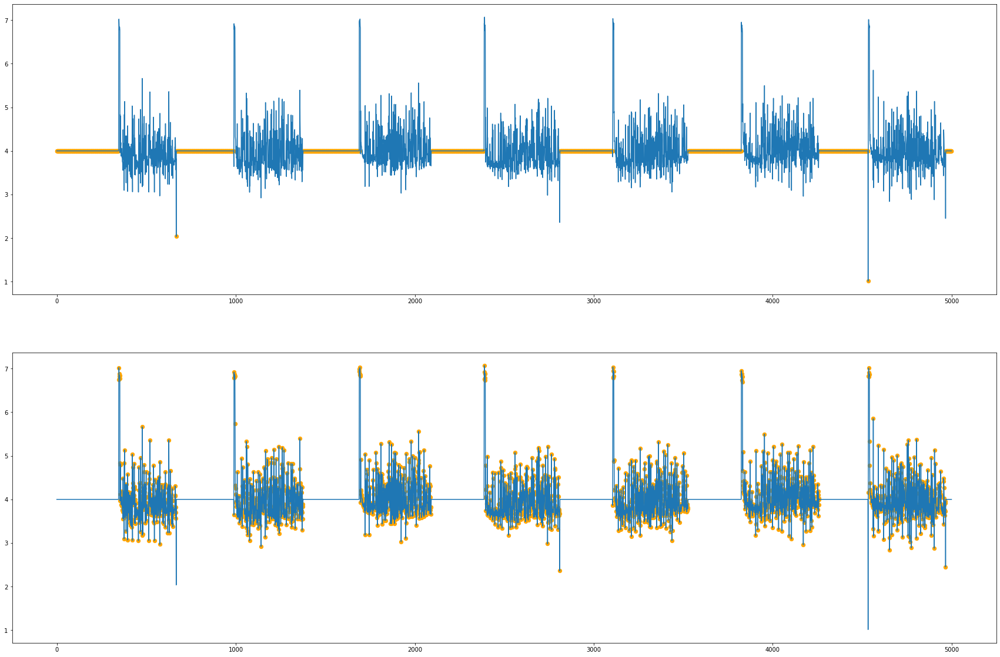

In [148]:
delta = 5000
y = np.arange(delta)
plt.figure(figsize=(30,20))
plt.subplot(2, 1, 1)
plt.plot(y, X[:delta])
plt.scatter(y[np.where(ans[:delta] == 1)], X[np.where(ans[:delta] == 1)], color='orange', s=40, marker='o')
plt.subplot(2, 1, 2)
plt.plot(y, X[:delta])
plt.scatter(y[np.where(ans[:delta] == 0)], X[np.where(ans[:delta] == 0)], color='orange', s=40, marker='o')

# Часы работы: удалить, когда выкл

In [212]:
not_zer = np.array(np.where(X > 1000))
not_zer = not_zer[0,: ]

In [215]:
work_X = []
work_time = []
for i in not_zer:
    #print(i)
    #print(enc_time[i])
    work_X.append(X[i])
    work_time.append(enc_time[i])
work_X = np.array(work_X)
#work_X = np.array(work_X[0,: ])
work_time = np.array(work_time)
#work_time = np.array(work_time[0,: ])

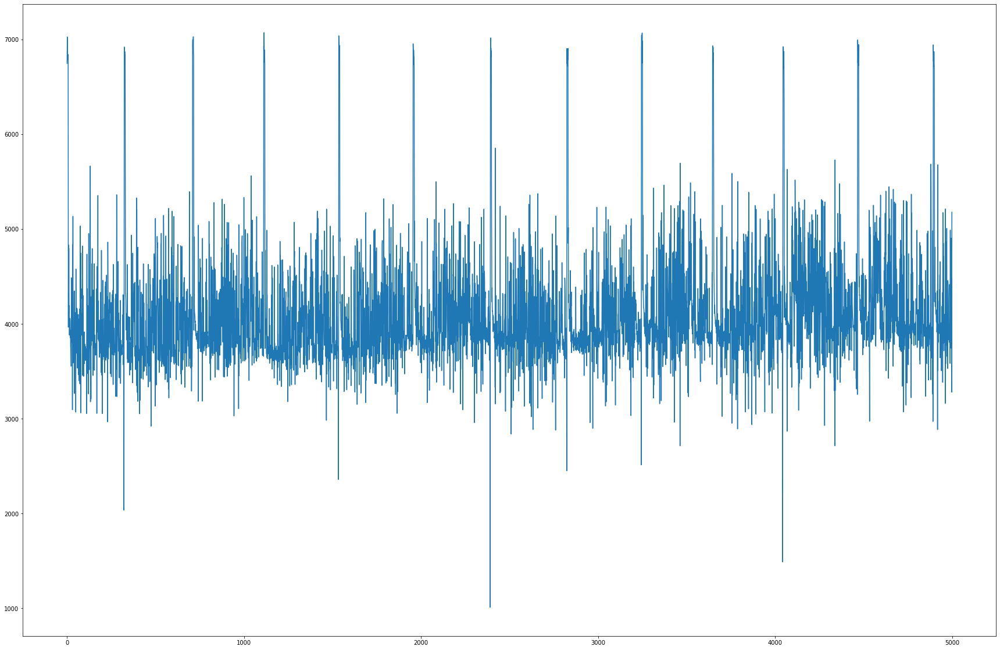

In [217]:
delta = 5000
y = np.arange(delta)
plt.figure(figsize=(30,20))
plt.plot(y, work_X[:delta])

In [218]:
z = np.array(np.column_stack([work_X, work_time]))

In [223]:
WS = 100
km = KMeans(n_clusters=3, random_state=0).fit(z)

ans = np.zeros(z.shape[0])
for i in range(z.shape[0] - WS):
    curr_z = z[i : i + WS]
    pred = km.predict(curr_z)
    ans[i : i + WS] += pred
    
for i in range(WS):
    ans[i] /= (i + 1)
    ans[ans.shape[0] - (i + 1)] /= (i + 1)

ans[WS:-WS] /= WS
ans[ans >= 0.5] = 1
ans[ans < 0.5] = 0

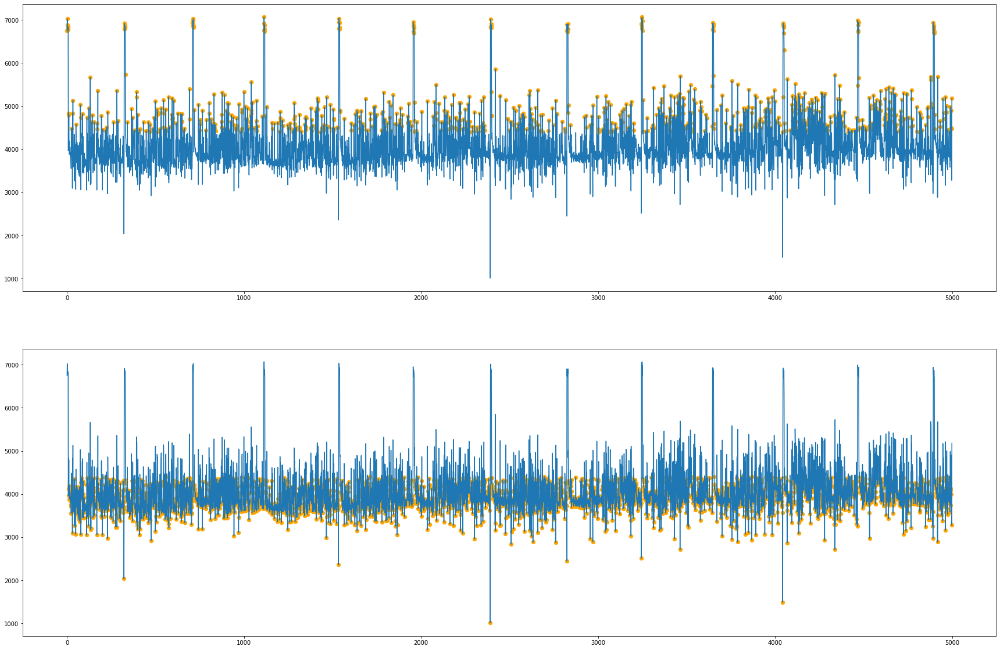

In [222]:
delta = 5000
y = np.arange(delta)
plt.figure(figsize=(30,20))
plt.subplot(2, 1, 1)
plt.plot(y, work_X[:delta])
plt.scatter(y[np.where(ans[:delta] == 1)], work_X[np.where(ans[:delta] == 1)], color='orange', s=40, marker='o')
plt.subplot(2, 1, 2)
plt.plot(y, work_X[:delta])
plt.scatter(y[np.where(ans[:delta] == 0)], work_X[np.where(ans[:delta] == 0)], color='orange', s=40, marker='o')

In [224]:
km = KMeans(n_clusters=3, random_state=0).fit(z)
pred = km.predict(z)

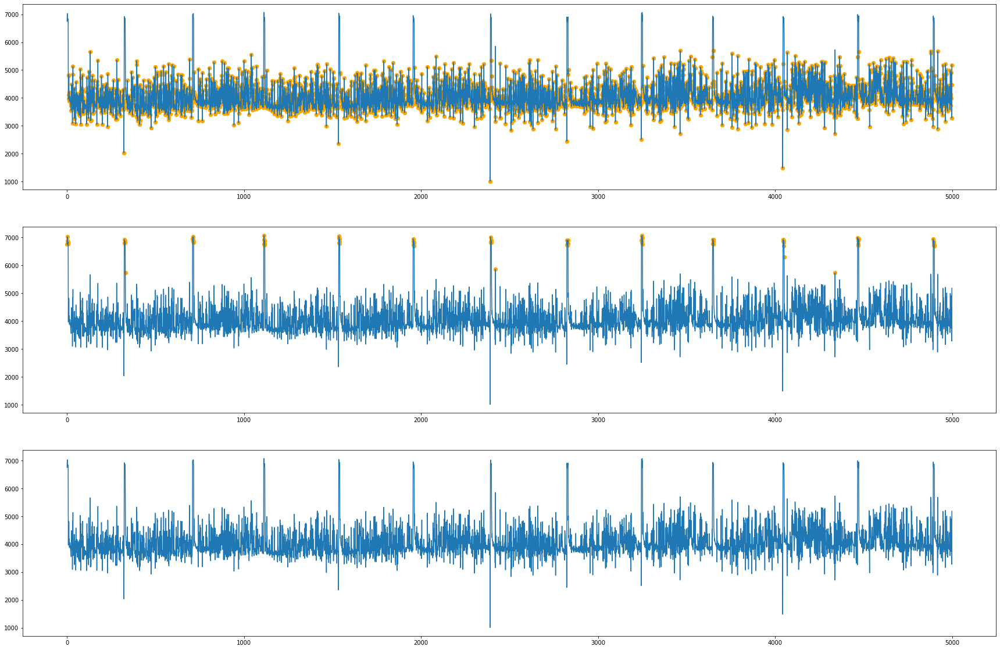

In [225]:
delta = 5000
y = np.arange(delta)
plt.figure(figsize=(30,20))
plt.subplot(3, 1, 1)
plt.plot(y, work_X[:delta])
plt.scatter(y[np.where(ans[:delta] == 1)], work_X[np.where(ans[:delta] == 1)], color='orange', s=40, marker='o')
plt.subplot(3, 1, 2)
plt.plot(y, work_X[:delta])
plt.scatter(y[np.where(ans[:delta] == 0)], work_X[np.where(ans[:delta] == 0)], color='orange', s=40, marker='o')
plt.subplot(3, 1, 3)
plt.plot(y, work_X[:delta])
plt.scatter(y[np.where(ans[:delta] == 2)], work_X[np.where(ans[:delta] == 2)], color='orange', s=40, marker='o')

# C  means

In [233]:
z = np.array(np.column_stack([X, enc_time[:100000]]))
fcm = FCM(n_clusters=2)
fcm.fit(z)
pred_soft = fcm.soft_predict(z)

In [234]:
pred_soft

array([[9.99987892e-01, 1.21079271e-05],
       [9.99987617e-01, 1.23828788e-05],
       [9.99987755e-01, 1.22450183e-05],
       ...,
       [1.32348350e-01, 8.67651650e-01],
       [1.20780953e-01, 8.79219047e-01],
       [2.47288064e-04, 9.99752712e-01]])

In [246]:
pred = []
for i in pred_soft:
    if i[0] < i[1]:
        pred.append(1)
    else:
        pred.append(0)
pred = np.array(pred)

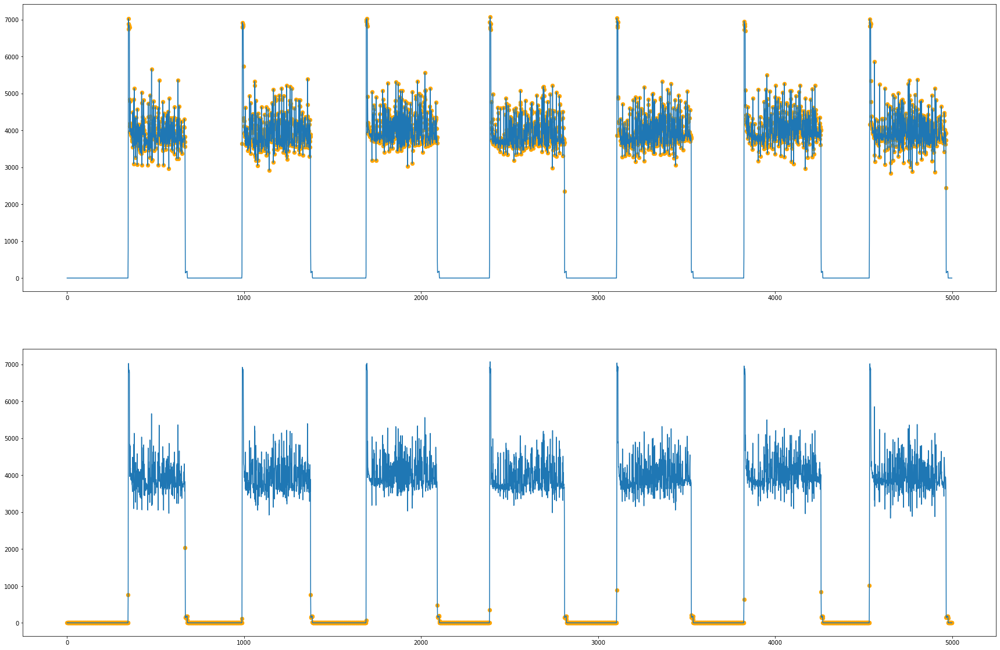

In [248]:
delta = 5000
y = np.arange(delta)
plt.figure(figsize=(30,20))
plt.subplot(2, 1, 1)
plt.plot(y, X[:delta])
plt.scatter(y[np.where(pred[:delta] == 1)], X[np.where(pred[:delta] == 1)], color='orange', s=40, marker='o')
plt.subplot(2, 1, 2)
plt.plot(y, X[:delta])
plt.scatter(y[np.where(pred[:delta] == 0)], X[np.where(pred[:delta] == 0)], color='orange', s=40, marker='o')

# Многомерные данные

X - первые 100к total AP max\
enc_time - первые 100к времени в кодировке


In [277]:
i = 0
j = 0
data = []
while (i <= len(elec) - 1) and (j <= len(temp)):
    print(i, j)
    if elec.event_timestamp[i] < temp.event_timestamp[j]:
        #data.append([elec.event_timestamp[i], X[i], np.NaN])
        i += 1
        #j += 1
    if elec.event_timestamp[i] == temp.event_timestamp[j]:
        data.append([elec.event_timestamp[i], X[i], temp.event_timestamp[j]])
        i += 1
        j += 1
    if elec.event_timestamp[i] > temp.event_timestamp[j]:
        i += 1

0 0
1 0
2 0
3 0
4 0
5 0
6 0
7 0
8 0
9 0
10 0
11 0
12 0
13 0
14 0
15 0
16 0
17 0
18 0
19 0
20 0
21 0
22 0
23 0
24 0
25 0
26 0
27 0
28 0
29 0
30 0
31 0
32 0
33 0
34 0
35 0
36 0
37 0
38 0
39 0
40 0
41 0
42 0
43 0
44 0
45 0
46 0
47 0
48 0
49 0
50 0
51 0
52 0
53 0
54 0
55 0
56 0
57 0
58 0
59 0
60 0
61 0
62 0
63 0
64 0
65 0
66 0
67 0
68 0
69 0
70 0
71 0
72 0
73 0
74 0
75 0
76 0
77 0
78 0
79 0
80 0
81 0
82 0
83 0
84 0
85 0
86 0
87 0
88 0
89 0
90 0
91 0
92 0
93 0
94 0
95 0
96 0
97 0
98 0
99 0
100 0
101 0
102 0
103 0
104 0
105 0
106 0
107 0
108 0
109 0
110 0
111 0
112 0
113 0
114 0
115 0
116 0
117 0
118 0
119 0
120 0
121 0
122 0
123 0
124 0
125 0
126 0
127 0
128 0
129 0
130 0
131 0
132 0
133 0
134 0
135 0
136 0
137 0
138 0
139 0
140 0
141 0
142 0
143 0
144 0
145 0
146 0
147 0
148 0
149 0
150 0
151 0
152 0
153 0
154 0
155 0
156 0
157 0
158 0
159 0
160 0
161 0
162 0
163 0
164 0
165 0
166 0
167 0
168 0
169 0
170 0
171 0
172 0
173 0
174 0
175 0
176 0
177 0
178 0
179 0
180 0
181 0
182 0
183 0
184 0


# Интерполяция. Анализ
Если интерполировать с интервалом 30 мин, получим примерно 30 пропусков. Непрерывный интервал - 161259 до конца (118406 записей)\
Начиная с даты:  2021-08-20 01:33:37\
\
Если интерполировать с интервалом 62 мин, получим 4 пропуска. Непрерывный интервал - 153409 до конца (126256 записей) \
Начиная с даты: 2021-08-09 08:34:12 \
4 пропуска:\
1 day, 3:50:36\
8:50:00\
1 day, 0:14:56\
8:24:37\
\
Если убрать эти 4 пропуска (очень грубо интерполировать), получим интервал - 83321 (196344 записей)\
Начиная с даты: 2021-05-03 23:08:38

In [129]:
e_time = np.array(elec.event_timestamp)
t_time = np.array(temp.event_timestamp)

In [130]:
inter = []
for i in e_time:
    if i in t_time:
        inter.append(1)
    else:
        inter.append(0)

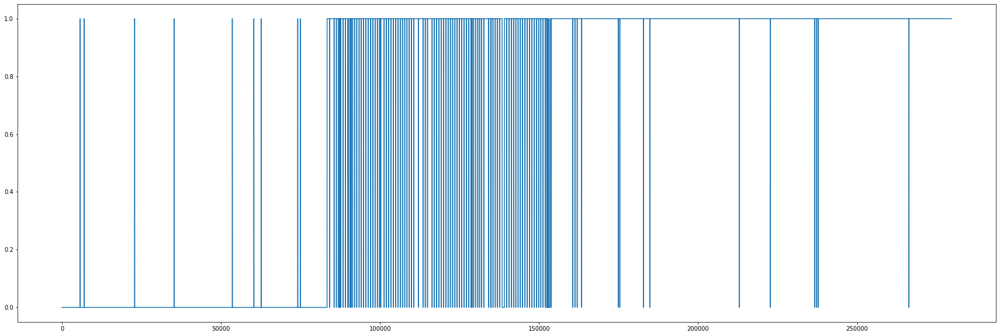

In [238]:
plt.figure(figsize=(30,10))
plt.plot(y, inter)

In [78]:
def check(s, e, l_time):
    #delt = l_time[e] - l_time[s]
    dt_delt = datetime.utcfromtimestamp(l_time[e]) - datetime.utcfromtimestamp(l_time[s])
    if dt_delt.total_seconds() > 1800:
        return False
    return True

def print_check(s, e, l_time):
    #delt = l_time[e] - l_time[s]
    dt_delt = datetime.utcfromtimestamp(l_time[e]) - datetime.utcfromtimestamp(l_time[s])
    print(dt_delt)

In [68]:
#test check
s = 10
e = 25
print(e_time[s], e_time[e], datetime.utcfromtimestamp(e_time[s]).strftime('%Y-%m-%d %H:%M:%S'), datetime.utcfromtimestamp(e_time[e]).strftime('%Y-%m-%d %H:%M:%S'))
print_check(s, e, e_time)

1609449633 1609451433 2020-12-31 21:20:33 2020-12-31 21:50:33
0:30:00


In [239]:
flag = 0

for i in range(1, len(inter)):
    if inter[i] == 1 and inter[i - 1] == 1:
        #print(2)
        flag = 1
    #else:
        #flag = 0
    if flag == 1 and inter[i] == 0:
        flag = 0
        count = 0
        start = i
        while i < len(inter) and inter[i] == 0:
            i += 1
        end = i
        if check(start, end, e_time):
            #print(1)
            for k in range(start, end):
                inter[k] = 1

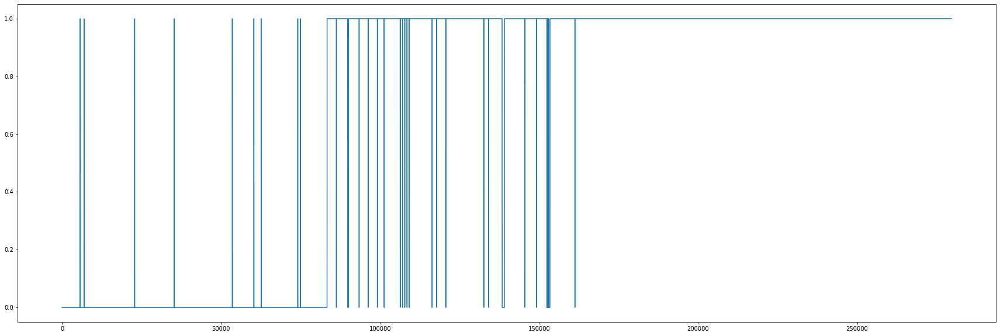

In [240]:
plt.figure(figsize=(30,10))
plt.plot(y, inter)

In [71]:
flag = 0

for i in range(1, len(inter)):
    if inter[i] == 1 and inter[i - 1] == 1:
        #print(2)
        flag = 1
    #else:
        #flag = 0
    if flag == 1 and inter[i] == 0:
        flag = 0
        count = 0
        start = i
        while i < len(inter) and inter[i] == 0:
            i += 1
        end = i
        if not check(start, end, e_time):
            #print(1)
            print_check(start, end, e_time)
            #for k in range(start, end):
                #inter[k] = 1

1 day, 3:50:36
8:50:00
1 day, 0:14:56
8:24:37


In [41]:
len(inter) - np.array(inter).sum()

85355

In [81]:
print('МАКСИМАЛЬНЫЙ НЕПРЕРЫВНЫЙ ОТРЫВОК ВРЕМЕНИ ПОСЛЕ ИНТЕРПОЛЯЦИИ 30 мин: ')

for i in range(len(inter) - 1, 0, -1):
    if inter[i] == 0:
        print(i)
        max_i = i
        break
print('КОЛ-ВО ЗАПИСЕЙ: ', len(e_time) - max_i)
print('НАЧИНАЯ С ДАТЫ: ', datetime.utcfromtimestamp(e_time[max_i]).strftime('%Y-%m-%d %H:%M:%S'))

МАКСИМАЛЬНЫЙ НЕПРЕРЫВНЫЙ ОТРЫВОК ВРЕМЕНИ ПОСЛЕ ИНТЕРПОЛЯЦИИ 30 мин: 
161259
КОЛ-ВО ЗАПИСЕЙ:  118406
НАЧИНАЯ С ДАТЫ:  2021-08-20 01:33:37


In [82]:
def check_62(s, e, l_time):
    #delt = l_time[e] - l_time[s]
    dt_delt = datetime.utcfromtimestamp(l_time[e]) - datetime.utcfromtimestamp(l_time[s])
    if dt_delt.total_seconds() > 3800:
        return False
    return True

def print_check(s, e, l_time):
    #delt = l_time[e] - l_time[s]
    dt_delt = datetime.utcfromtimestamp(l_time[e]) - datetime.utcfromtimestamp(l_time[s])
    print(dt_delt)

In [85]:
flag = 0

for i in range(1, len(inter)):
    if inter[i] == 1 and inter[i - 1] == 1:
        #print(2)
        flag = 1
    #else:
        #flag = 0
    if flag == 1 and inter[i] == 0:
        flag = 0
        count = 0
        start = i
        while i < len(inter) and inter[i] == 0:
            i += 1
        end = i
        if check_62(start, end, e_time):
            #print(1)
            for k in range(start, end):
                inter[k] = 1

In [87]:
print('МАКСИМАЛЬНЫЙ НЕПРЕРЫВНЫЙ ОТРЫВОК ВРЕМЕНИ ПОСЛЕ ИНТЕРПОЛЯЦИИ 60 мин: ')

for i in range(len(inter) - 1, 0, -1):
    if inter[i] == 0:
        print(i)
        max_i = i
        break
        
print('КОЛ-ВО ЗАПИСЕЙ: ', len(e_time) - max_i)
print('НАЧИНАЯ С ДАТЫ: ', datetime.utcfromtimestamp(e_time[max_i]).strftime('%Y-%m-%d %H:%M:%S'))

МАКСИМАЛЬНЫЙ НЕПРЕРЫВНЫЙ ОТРЫВОК ВРЕМЕНИ ПОСЛЕ ИНТЕРПОЛЯЦИИ 60 мин: 
153409
КОЛ-ВО ЗАПИСЕЙ:  126256
НАЧИНАЯ С ДАТЫ:  2021-08-09 08:34:12


In [88]:
def big_check(s, e, l_time):
    #delt = l_time[e] - l_time[s]
    dt_delt = datetime.utcfromtimestamp(l_time[e]) - datetime.utcfromtimestamp(l_time[s])
    if dt_delt.total_seconds() > (84600 + 14400):
        return False
    return True

def print_check(s, e, l_time):
    #delt = l_time[e] - l_time[s]
    dt_delt = datetime.utcfromtimestamp(l_time[e]) - datetime.utcfromtimestamp(l_time[s])
    print(dt_delt)

In [89]:
flag = 0

for i in range(1, len(inter)):
    if inter[i] == 1 and inter[i - 1] == 1:
        #print(2)
        flag = 1
    #else:
        #flag = 0
    if flag == 1 and inter[i] == 0:
        flag = 0
        count = 0
        start = i
        while i < len(inter) and inter[i] == 0:
            i += 1
        end = i
        if big_check(start, end, e_time):
            #print(1)
            for k in range(start, end):
                inter[k] = 1

In [90]:
print('МАКСИМАЛЬНЫЙ НЕПРЕРЫВНЫЙ ОТРЫВОК ВРЕМЕНИ ПОСЛЕ ГРУБОЙ ИНТЕРПОЛЯЦИИ: ')

for i in range(len(inter) - 1, 0, -1):
    if inter[i] == 0:
        print(i)
        max_i = i
        break
        
print('КОЛ-ВО ЗАПИСЕЙ: ', len(e_time) - max_i)
print('НАЧИНАЯ С ДАТЫ: ', datetime.utcfromtimestamp(e_time[max_i]).strftime('%Y-%m-%d %H:%M:%S'))

МАКСИМАЛЬНЫЙ НЕПРЕРЫВНЫЙ ОТРЫВОК ВРЕМЕНИ ПОСЛЕ ГРУБОЙ ИНТЕРПОЛЯЦИИ: 
83321
КОЛ-ВО ЗАПИСЕЙ:  196344
НАЧИНАЯ С ДАТЫ:  2021-05-03 23:08:38


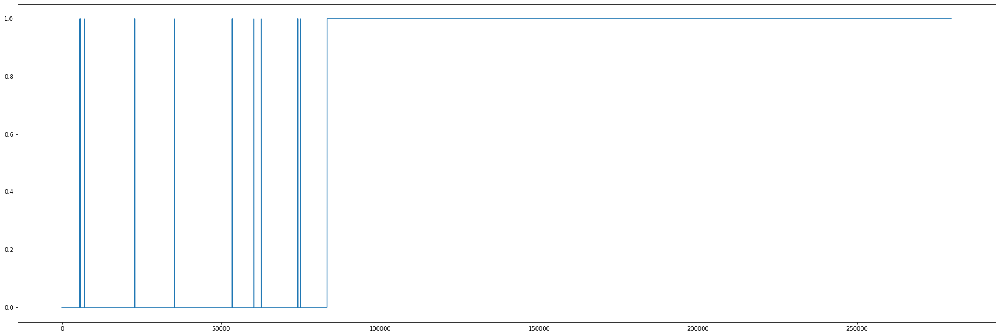

In [91]:
plt.figure(figsize=(30,10))
plt.plot(y, inter)

# Интерполяция температуры. Интервал < 30 минут

In [227]:
st = 161259
e_time = np.array(elec.event_timestamp)
t_time = np.array(temp.event_timestamp)
inter = []
t_temp = []
for j, i in enumerate(e_time):
    if i in t_time:
        inter.append(1)
        if len(np.where(temp.event_timestamp == i)[0]) == 1:
            #print(j, i, temp['value'][np.where(temp['event_timestamp'] == i)[0]])
            #print(float(temp['value'][np.where(temp['event_timestamp'] == i)[0]]) )
            t_temp.append(float(temp['value'][np.where(temp['event_timestamp'] == i)[0]]))
        elif len(np.where(temp.event_timestamp == i)[0]) > 1:
            #print(j, i, temp['value'][np.where(temp['event_timestamp'] == i)[0][0]])
            #print(float(temp['value'][np.where(temp['event_timestamp'] == i)[0][0]]) )
            t_temp.append(float(temp['value'][np.where(temp['event_timestamp'] == i)[0][0]]))
    else:
        inter.append(0)
        t_temp.append(0)

In [228]:
t_temp = np.array(t_temp)
COPY_TEMP = np.copy(t_temp)

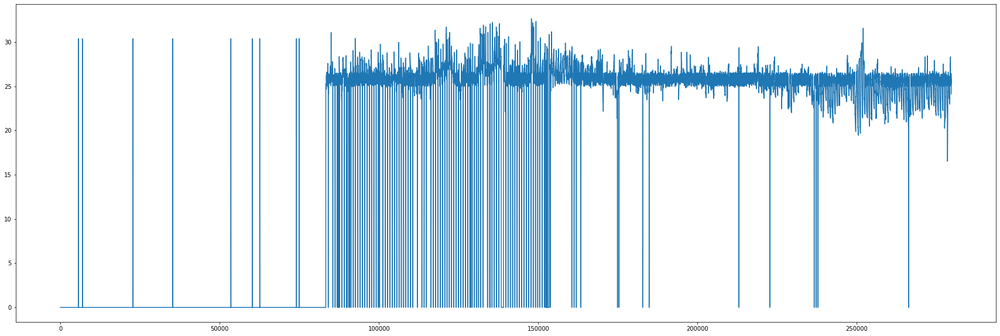

In [287]:
y = np.arange(len(inter))
plt.figure(figsize=(30,10))
plt.plot(y, t_temp)

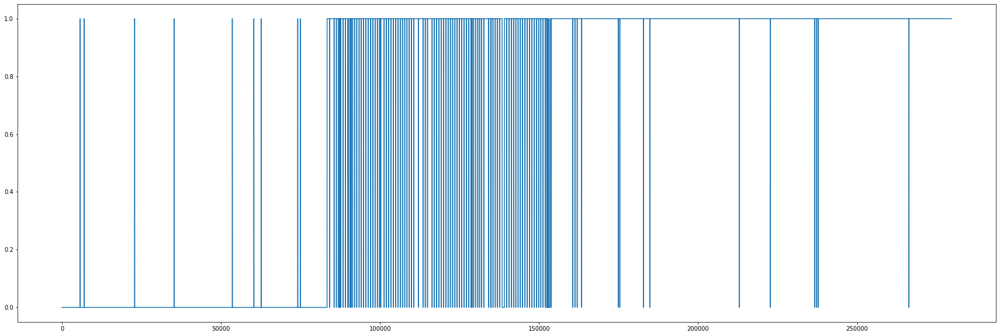

In [274]:
y = np.arange(len(inter))
plt.figure(figsize=(30,10))
plt.plot(y, inter)

In [284]:
#t_temp = np.copy(COPY_TEMP)

In [288]:
flag = 0

for i in range(1, len(inter)):
    if inter[i] == 1 and inter[i - 1] == 1:
        #print(2)
        flag = 1
        y = []
        x = []
        y.append(t_temp[i - 1])
        y.append(t_temp[i])
        
        x.append(e_time[i - 1])
        x.append(e_time[i])
        
    #else:
        #flag = 0
    if flag == 1 and inter[i] == 0:
        flag = 0
        #count = 0
        #y = []
        start = i
        new_x = []
        while i < len(inter) and inter[i] == 0:
            new_x.append(e_time[i])
            i += 1
            
        end = i
        y.append(t_temp[i])
        x.append(e_time[i])
        if check(start, end, e_time):
            for k in range(start, end):
                inter[k] = 1
            f = interpolate.interp1d(x, y, fill_value="extrapolate")
            #print(x, y, new_x)
            new_x = f(new_x)
            t_temp[start:end] += new_x
            #print(new_x, start, end, t_temp[start - 2:end + 2])

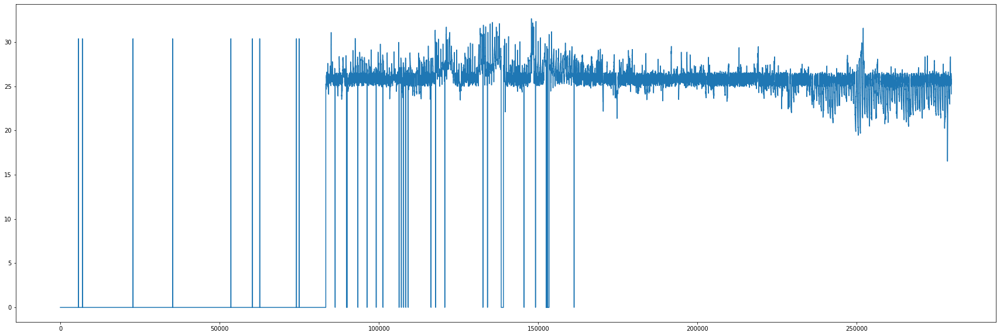

In [289]:
y = np.arange(len(inter))
plt.figure(figsize=(30,10))
plt.plot(y, t_temp)

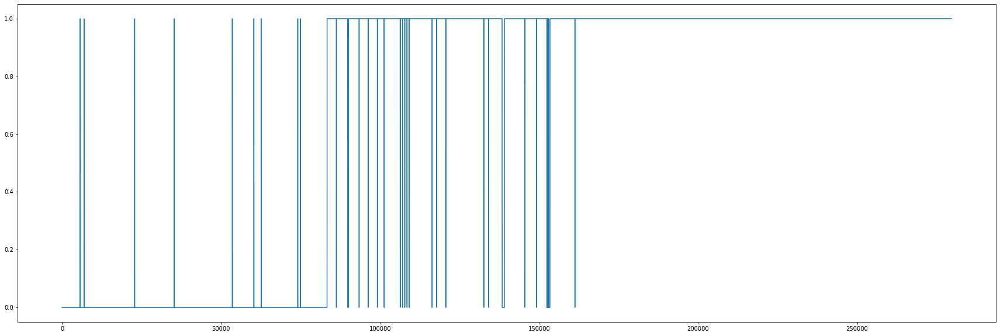

In [290]:
y = np.arange(len(inter))
plt.figure(figsize=(30,10))
plt.plot(y, inter)

# Интерполяция температуры и влажности. Интервал < 30 минут

In [293]:
e_time = np.array(elec.event_timestamp)
t_time = np.array(temp.event_timestamp)
h_time = np.array(hum.event_timestamp)
inter = []
t_temp = []
t_hum = []
for j, i in enumerate(e_time):
    if i in t_time and i in h_time:
        inter.append(1)
        if len(np.where(temp.event_timestamp == i)[0]) == 1:
            t_temp.append(float(temp['value'][np.where(temp['event_timestamp'] == i)[0]]))
        elif len(np.where(temp.event_timestamp == i)[0]) > 1:
            t_temp.append(float(temp['value'][np.where(temp['event_timestamp'] == i)[0][0]]))
            
        if len(np.where(hum.event_timestamp == i)[0]) == 1:
            t_hum.append(float(hum['value'][np.where(hum['event_timestamp'] == i)[0]]))
        elif len(np.where(hum.event_timestamp == i)[0]) > 1:
            t_hum.append(float(hum['value'][np.where(hum['event_timestamp'] == i)[0][0]]))
    else:
        inter.append(0)
        t_temp.append(0)
        t_hum.append(0)

In [294]:
t_temp = np.array(t_temp)
t_hum = np.array(t_hum)
COPY_TEMP = np.copy(t_temp)
COPY_HUM = np.copy(t_hum)

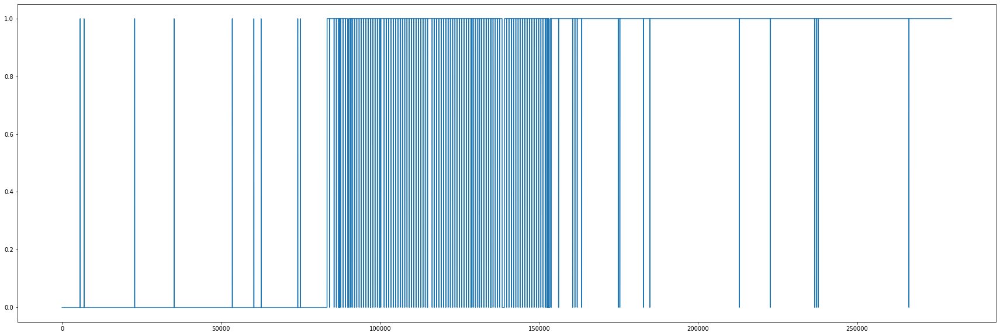

In [292]:
y = np.arange(len(inter))
plt.figure(figsize=(30,10))
plt.plot(y, inter)

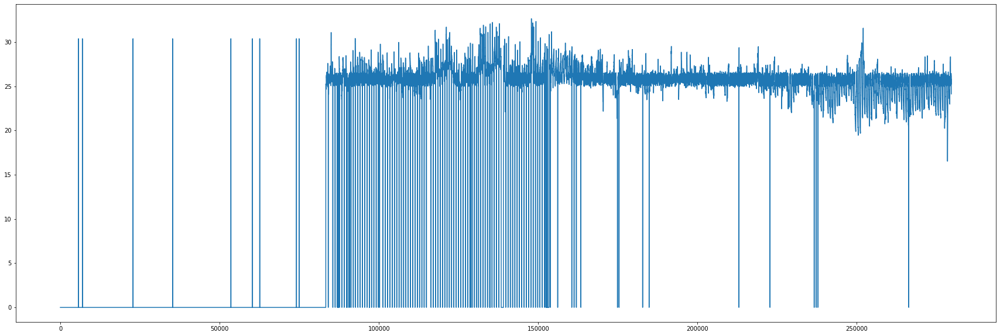

In [295]:
y = np.arange(len(inter))
plt.figure(figsize=(30,10))
plt.plot(y, t_temp)

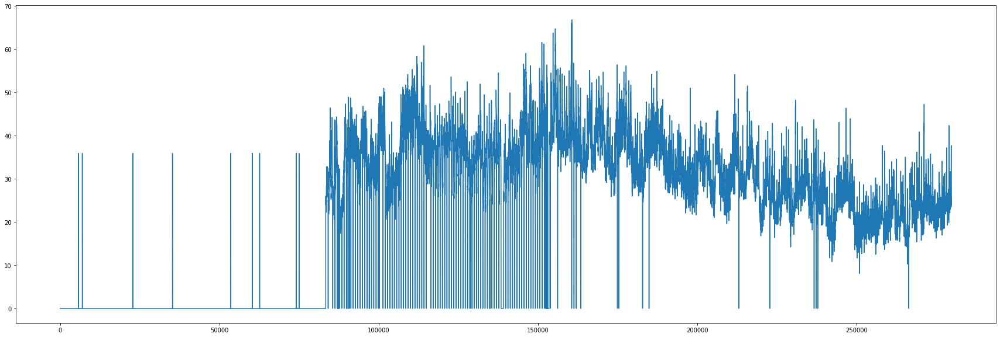

In [296]:
y = np.arange(len(inter))
plt.figure(figsize=(30,10))
plt.plot(y, t_hum)

In [298]:
flag = 0

for i in range(1, len(inter)):
    if inter[i] == 1 and inter[i - 1] == 1:
        #print(2)
        flag = 1
        y_t = []
        y_h = []
        x = []
        y_t.append(t_temp[i - 1])
        y_t.append(t_temp[i])
        y_h.append(t_hum[i - 1])
        y_h.append(t_hum[i])
        
        x.append(e_time[i - 1])
        x.append(e_time[i])
        
    #else:
        #flag = 0
    if flag == 1 and inter[i] == 0:
        flag = 0
        #count = 0
        #y = []
        start = i
        new_x = []
        while i < len(inter) and inter[i] == 0:
            new_x.append(e_time[i])
            i += 1
            
        end = i
        y_t.append(t_temp[i])
        y_h.append(t_hum[i])
        x.append(e_time[i])
        if check(start, end, e_time):
            for k in range(start, end):
                inter[k] = 1
            f_t = interpolate.interp1d(x, y_t, fill_value="extrapolate")
            f_h = interpolate.interp1d(x, y_h, fill_value="extrapolate")
            #print(x, y, new_x)
            new_y_t = f_t(new_x)
            new_y_h = f_h(new_x)
            t_temp[start:end] += new_y_t
            t_hum[start:end] += new_y_h
            #print(new_x, start, end, t_temp[start - 2:end + 2])

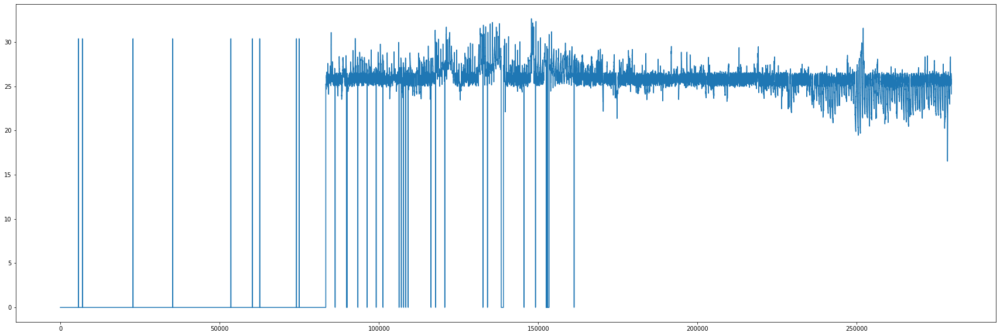

In [299]:
y = np.arange(len(inter))
plt.figure(figsize=(30,10))
plt.plot(y, t_temp)

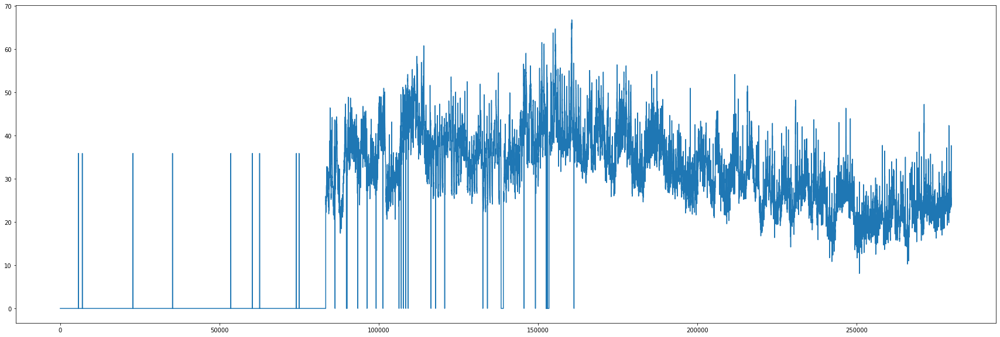

In [300]:
y = np.arange(len(inter))
plt.figure(figsize=(30,10))
plt.plot(y, t_hum)

In [301]:
np.save('interpolated_temp_30.npy', t_temp)
np.save('interpolated_hum_30.npy', t_hum)

# Подготовка данных вида: [день недели, минута, total_AP_max, temp, hum]

In [302]:
#week_day = []
#minut = []
#total_AP_max = []
#temperatute= []
#humidity = []

### total_AP_max

In [318]:
t = elec['event_timestamp']
t = pd.to_datetime(t)
dt = []
for i, j in enumerate(t):
    i += 1
    try:
        dt.append(t[i] - t[i - 1])
    except KeyError:
        continue
        
for i in range(len(dt)):
    dt[i] = dt[i].total_seconds()
dt = np.array(dt)
dt[np.where(dt == 0)] = 0.001

AP = elec['Total_AP_energy_max']
a = []
for j, i in enumerate(elec['Total_AP_energy_max'][:279664]):
    try:
        i = float(i)
    except ValueError:
        a.append(j)
for i in a:
    AP[i] = AP[i - 1]
AP = np.array(AP, dtype = float)
dAP = -1 * AP[:-1] + AP[1:]
dAP *= 1000
total_AP_max = dAP/dt

### week day

In [346]:
week_day = []
t = elec['event_timestamp']
for i in range(len(t)):
    #t[i] = datetime.utcfromtimestamp(t[i])
    week_day.append(t[i].weekday())

### minute

In [341]:
minute = []
for i in t:
    minute.append(i.hour * 60 + i.minute)

### Все данные

In [348]:
week_day = np.array(week_day)
minute = np.array(minute)
temperature = np.array(t_temp)
humidity = np.array(t_hum)
data = np.column_stack([week_day[161259:], minute[161259:], total_AP_max[161258:], temperature[161259:], humidity[161259:]])

In [352]:
df = pd.DataFrame(data, columns=['week_day', 'minute', 'total_AP_max', 'temperature', 'humidity'])

In [353]:
df

,week_day,minute,total_AP_max,temperature,humidity
0,4.0,93.0,350.000002,0.000,0.00
1,4.0,95.0,339.999999,28.115,46.58
2,4.0,97.0,350.000002,28.240,45.63
3,4.0,99.0,320.000006,28.240,45.63
4,4.0,101.0,310.000003,28.275,45.42
...,...,...,...,...,...
118401,0.0,1251.0,329.999995,24.650,23.69
118402,0.0,1253.0,330.000010,24.130,23.47
118403,0.0,1255.0,329.999995,24.130,23.47
118404,0.0,1257.0,329.999995,24.130,23.47


In [358]:
df.to_csv('IQDS_interpol_30.csv', index=False)

In [359]:
ddf = pd.read_csv('IQDS_interpol_30.csv')

In [360]:
ddf

,week_day,minute,total_AP_max,temperature,humidity
0,4.0,93.0,350.000002,0.000,0.00
1,4.0,95.0,339.999999,28.115,46.58
2,4.0,97.0,350.000002,28.240,45.63
3,4.0,99.0,320.000006,28.240,45.63
4,4.0,101.0,310.000003,28.275,45.42
...,...,...,...,...,...
118401,0.0,1251.0,329.999995,24.650,23.69
118402,0.0,1253.0,330.000010,24.130,23.47
118403,0.0,1255.0,329.999995,24.130,23.47
118404,0.0,1257.0,329.999995,24.130,23.47


# Гипотеза
Вывести все данные 
Попробовать разметить нектоторые аномалии
Обучить алгоритм


# Идея
Подгрузить погоду\
Выявить +- ровные участки по графику \
Работать и размечать отдельно эти участки, используя не только методы без учителя

In [209]:
x = np.arange(0, 10)
y = np.exp(-x/3.0)
f = interpolate.interp1d(x, y)

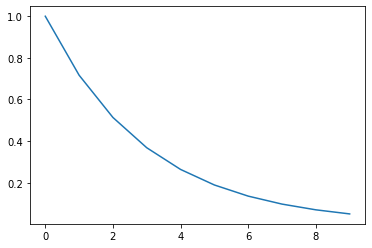

In [210]:
plt.plot(x, y)

In [211]:
xnew = [0.5, 0.7]
ynew = f(xnew)

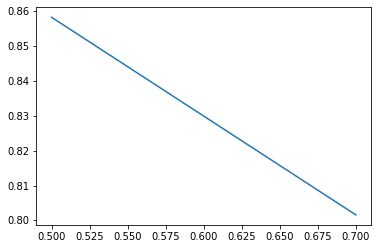

In [212]:
plt.plot(xnew, ynew)

In [145]:
temp

,event_timestamp,io_id,value,value_min,value_max
0,1610136637,5e03a7a4832a17ee33585eaf,30.38,30.38,30.38
1,1610283082,5e03a7a4832a17ee33585eaf,30.38,30.38,30.38
2,1612209511,5e03a7a4832a17ee33585eaf,30.38,30.38,30.38
3,1613705374,5e03a7a4832a17ee33585eaf,30.38,30.38,30.38
4,1615915770,5e03a7a4832a17ee33585eaf,30.38,30.38,30.38
...,...,...,...,...,...
193261,1643662314,5e03a7a4832a17ee33585eaf,24.65,24.65,24.65
193262,1643662434,5e03a7a4832a17ee33585eaf,24.13,24.13,24.65
193263,1643662554,5e03a7a4832a17ee33585eaf,24.13,24.13,24.13
193264,1643662674,5e03a7a4832a17ee33585eaf,24.13,24.13,24.13


In [150]:
temp['value'][np.where(temp['event_timestamp'] == 1643662314)[0]]

193261    24.65
Name: value, dtype: float64